# Music Genre Classification 

In this notebook I will go through the analysis of music and it's visualization & classification of the music genre.


The data contains the following:<br>
* __genre original__ - A collection of 10 genres with 100 audio files each, all having a length of 30 seconds (the famous GTZAN dataset, the MNIST of sounds) <br>
* __images original__ - A visual representation for each audio file. One way to classify data is through neural networks. Because NNs (like CNN, what we will be using today) usually take in some sort of image representation, the audio files were converted to Mel Spectrograms to make this possible. <br>
* __2 CSV files__ - Containing features of the audio files. One file has for each song (30 seconds long) a mean and variance computed over multiple features that can be extracted from an audio file. The other file has the same structure, but the songs were split before into 3 seconds audio files (this way increasing 10 times the amount of data we fuel into our classification models). With data, more is always better. <br><br>

__Note:__ To run this Jupyter Notebook, please download the dataset that is used in this notebook from [here](https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/).

## Library Imports

In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)

import numpy as np
import librosa # For processing and visualization of audio 

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.preprocessing import minmax_scale, scale, LabelEncoder, StandardScaler, MinMaxScaler

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

from catboost import CatBoostClassifier
import xgboost as xgb

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import joblib

In [2]:
data3 = pd.read_csv("data/features_3_sec.csv")
data = pd.read_csv("data/features_30_sec.csv")
data.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,9.015054e+05,0.083045,0.000767,-4.529724e-05,0.008172,0.000008,0.005698,123.046875,-113.570648,2564.207520,121.571793,295.913818,-19.168142,235.574432,42.366421,151.106873,-6.364664,167.934799,18.623499,89.180840,-13.704891,67.660492,15.343150,68.932579,-12.274110,82.204201,10.976572,63.386311,-8.326573,61.773094,8.803792,51.244125,-3.672300,41.217415,5.747995,40.554478,-5.162882,49.775421,0.752740,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,2.977893e+06,0.056040,0.001448,1.395807e-04,0.005099,-0.000178,0.003063,67.999589,-207.501694,7764.555176,123.991264,560.259949,8.955127,572.810913,35.877647,264.506104,2.907320,279.932922,21.510466,156.477097,-8.560436,200.849182,23.370686,142.555954,-10.099661,166.108521,11.900497,104.358612,-5.555639,105.173630,5.376327,96.197212,-2.231760,64.914291,4.220140,73.152534,-6.012148,52.422142,0.927998,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,7.840345e+05,0.076291,0.001007,2.105576e-06,0.016342,-0.000019,0.007458,161.499023,-90.722595,3319.044922,140.446304,508.765045,-29.093889,411.781219,31.684334,144.090317,-13.984504,155.493759,25.764742,74.548401,-13.664875,106.981827,11.639934,106.574875,-11.783643,65.447945,9.718760,67.908859,-13.133803,57.781425,5.791199,64.480209,-8.907628,60.385151,-1.077000,57.711136,-9.229274,36.580986,2.451690,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,1.493194e+06,0.033309,0.000423,4.583644e-07,0.019054,-0.000014,0.002712,63.024009,-199.544205,5507.517090,150.090897,456.505402,5.662678,257.161163,26.859079,158.267303,1.771399,268.034393,14.234031,126.794128,-4.832006,155.912079,9.286494,81.273743,-0.759186,92.114090,8.137607,71.314079,-3.200653,110.236687,6.079319,48.251999,-2.480174,56.799400,-1.079305,62.289902,-2.870789,51.651592,0.780874,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,1.572978e+06,0.101461,0.001954,-1.756129e-05,0.004814,-0.000010,0.003094,135.999178,-160.337708,5195.291992,126.219635,853.784729,-35.587811,333.792938,22.148071,193.456100,-32.478600,336.276825,10.852294,134.831573,-23.352329,93.257095,0.498434,124.672127,-11.793437,130.073349,1.207256,99.675575,-13.088418,80.254066,-2.813867,86.430626,-6.933385,89.555443,-7.552725,70.943336,-9.164666,75.793404,-4.520576,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [3]:
# Types of Generes in this dataset
genres = list(data['label'].unique())
print("Genres: ", genres)

Genres:  ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


In [4]:
data.columns

Index(['filename', 'length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean',
       'rms_var', 'spectral_centroid_mean', 'spectral_centroid_var',
       'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean',
       'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
       'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var', 'tempo',
       'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean',
       'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',
       'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean',
       'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var',
       'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean',
       'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
       'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean',
       'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var',
  

This dataset has a <code>.csv</code> file which contains several features extracted from every audio files. I will explore all thes features by visualizing the audio files of every genres. <br><br>

## Exploring Audio Files

Since there are audio files for each genre, I will explore the audio files with <code>lirosa</code> library. This library is extensively used for much of the audio exploration.<br>


Audio Features for visualization (not necessarily in order)
* ___Sound Waves___
* ___Fourier Transformation___
* ___Spectogram___
* ***Chroma Frequencies (chroma_stft)***
* ***Spectral Centroid (spectral_centroid)***
* ***Spectral Bandwidth (spectral_bandwith)***
* ***Spectral Rolloff (rolloff)***
* ___Zero Crossing Rate (zero_crossing_rate)___
* ___Harmony & Percussion (harmony & perceptr)___
* ___Tempo - BPM (Beats Per Minute)___
* ___Mel Spectrogram & Mel-Frequency Cepstral Coefficients (mfcc)___

In [5]:
base_path = 'data/audio-files/'

In [6]:
# Preparing audio files for every genre
songs = [('{}/{}'.format(base_path, g)) for g in list(data.groupby(['label'])['filename'].first())]
audios = [librosa.load(s, sr=None) for s in songs]

### Sampling Rate<sup>[1]</sup>

Sampling Rate means how many samples are recorded per second. <br>

* __Samples__ column indicates total number of samples recorded 
* __Sampling__ Rate Indicates the no. of samples the recorder was recording per second
* __Duration__ is the simple division: <code>Samples / Sampling rate</code>

In [7]:
pd.DataFrame(data={'Genre':genres,
                   'Samples':[len(a[0]) for a in audios],
                   'Sampling Rate':[a[1] for a in audios],
                   'Duration': ["{:.2f} Sec".format(len(a[0]) / a[1]) for a in audios]}) 


,Genre,Samples,Sampling Rate,Duration
0,blues,661794,22050,30.01 Sec
1,classical,661794,22050,30.01 Sec
2,country,663300,22050,30.08 Sec
3,disco,664180,22050,30.12 Sec
4,hiphop,661504,22050,30.00 Sec
5,jazz,661794,22050,30.01 Sec
6,metal,661504,22050,30.00 Sec
7,pop,661504,22050,30.00 Sec
8,reggae,661794,22050,30.01 Sec
9,rock,661794,22050,30.01 Sec


### Sound Waves

In [8]:
import random

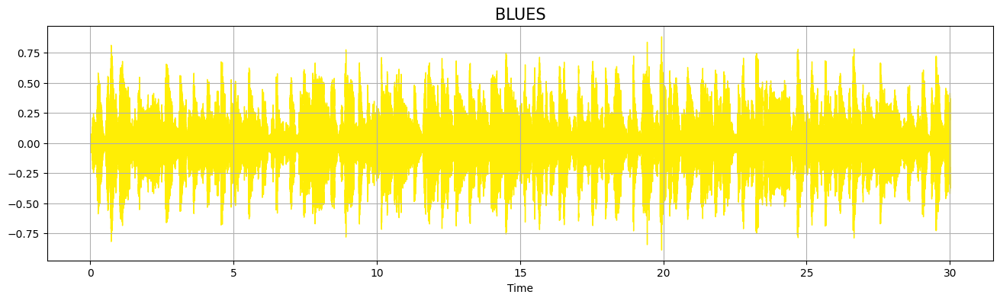

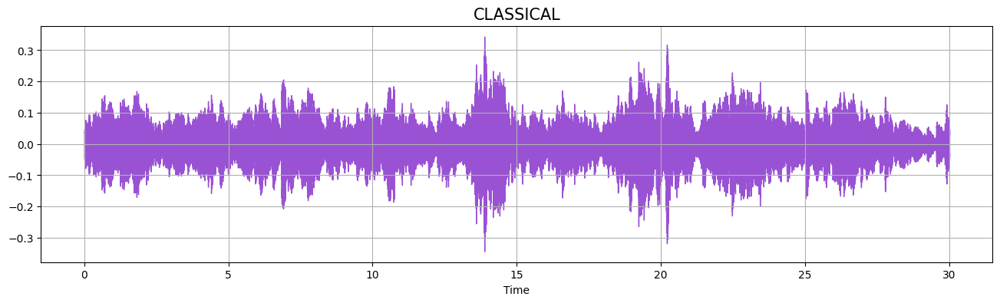

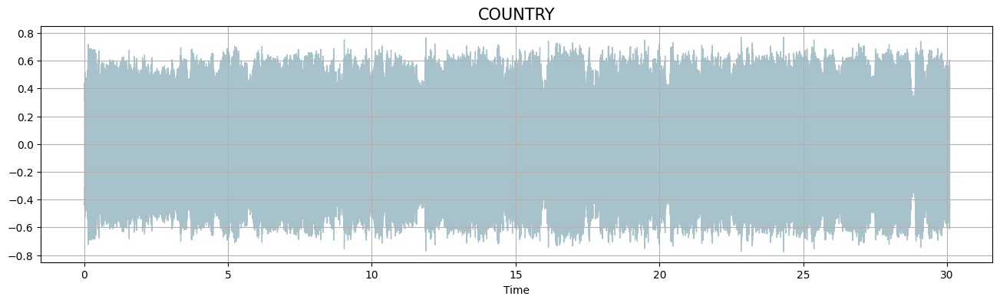

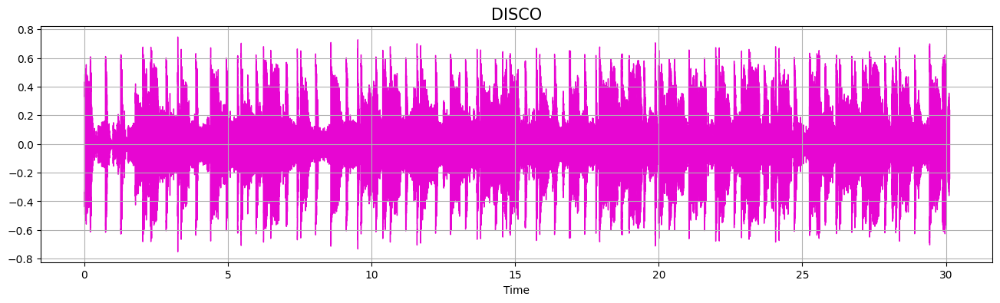

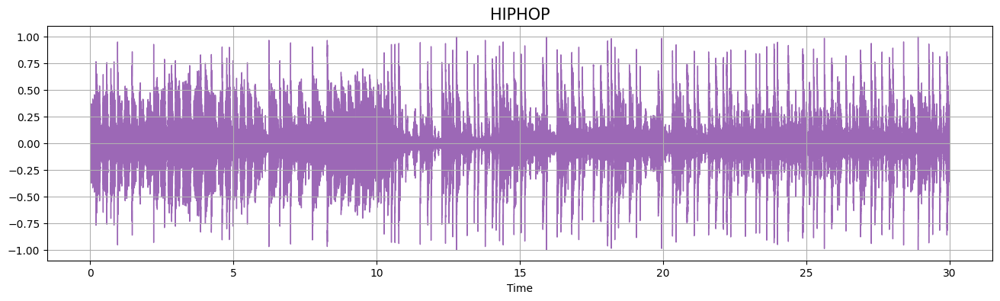

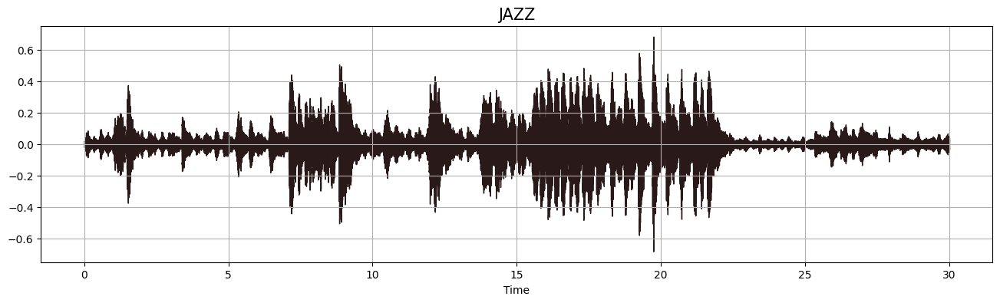

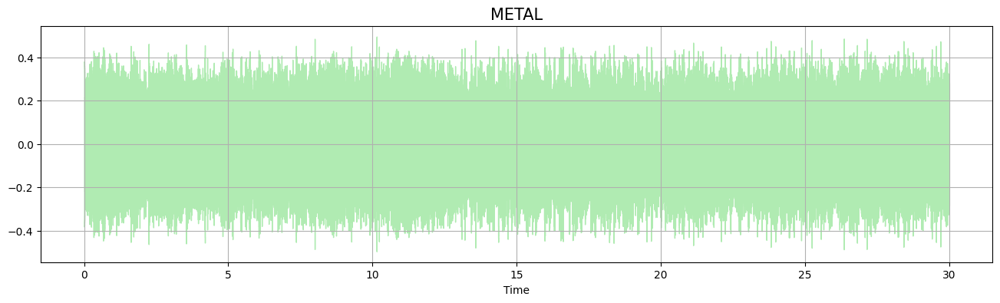

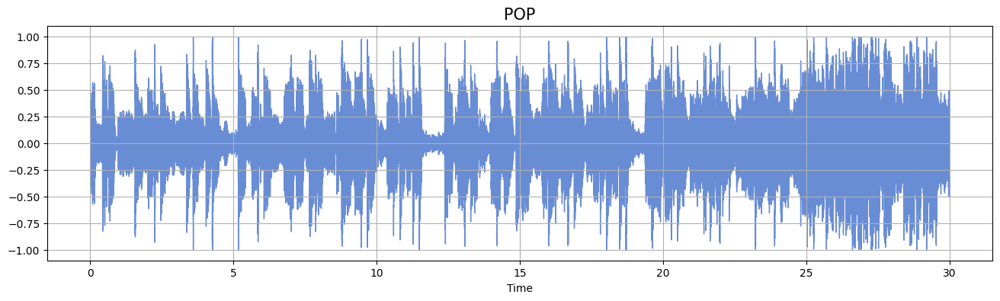

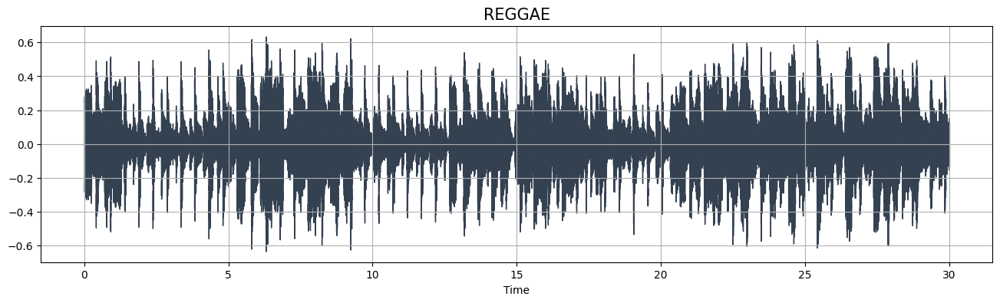

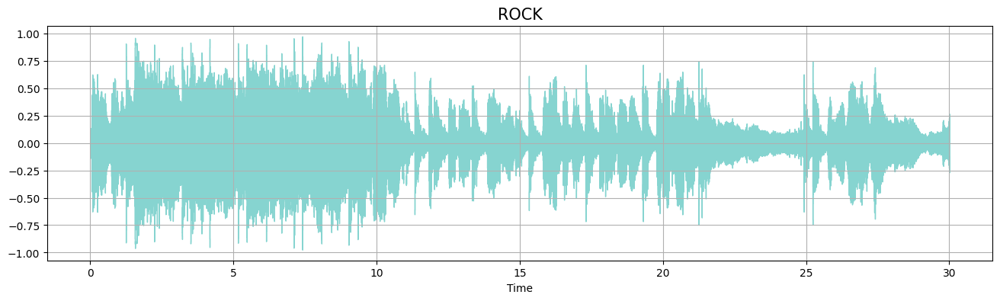

In [9]:
for a, g in zip(audios, genres):
    plt.figure(figsize = (16, 4))
    librosa.display.waveshow(y = a[0], sr = a[1], color = f"#{random.randrange(0x1000000):06x}".upper(), )
    plt.title(f"{g}".upper(), fontsize=15)
    plt.grid()

### Fourier Transform
Fourier Transformation(FT) helps to transform the signals from time domain to frequency domain.<sup>__[2]__</sup>

### But why is it necessary to convert audio from <code>time</code> domain to <code>frequency</code> domain?
FT is used in audio processing for several reasons<sup>__[3]__</sup><br>
* __Frequency Manipulation:__  By understanding the frequency components of an audio signal, we can manipulate them in various ways. This includes filtering out unwanted frequencies (e.g., noise reduction), emphasizing certain frequencies (e.g., equalization), or modifying the overall spectral characteristics of the audio.
* __Compression:__ Fourier Transform is essential in audio compression techniques such as MP3. By transforming the audio signal into the frequency domain, we can identify and exploit redundancies or perceptually less important components, thus reducing the amount of data required to represent the audio signal while maintaining perceptual quality.
* __Feature Extraction:__ In audio analysis tasks such as speech recognition or music genre classification, extracting relevant features from the audio signal is crucial. Fourier Transform helps in extracting features related to the frequency content of the audio, which can then be used for further analysis or classification.

Overall, Fourier Transform plays a fundamental role in understanding, manipulating, and processing audio signals, making it an essential tool in audio engineering and signal processing.

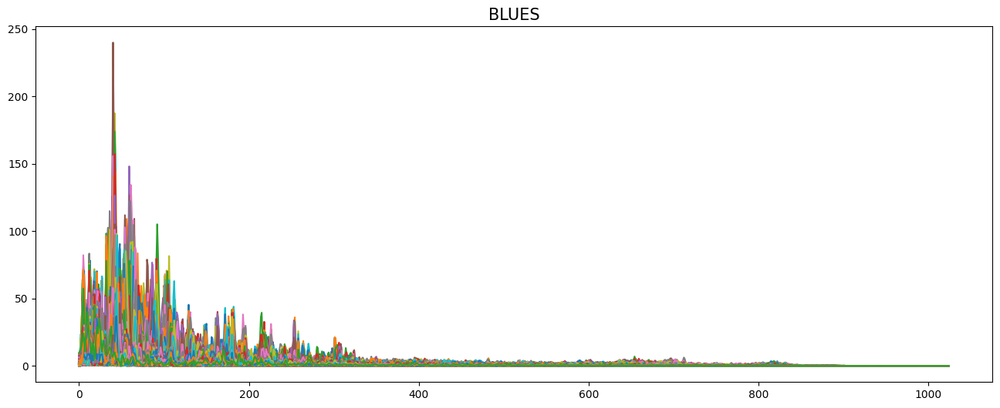

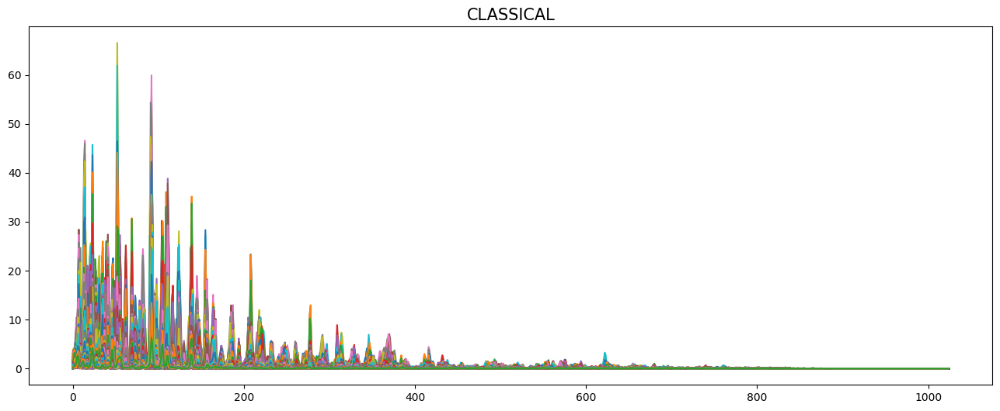

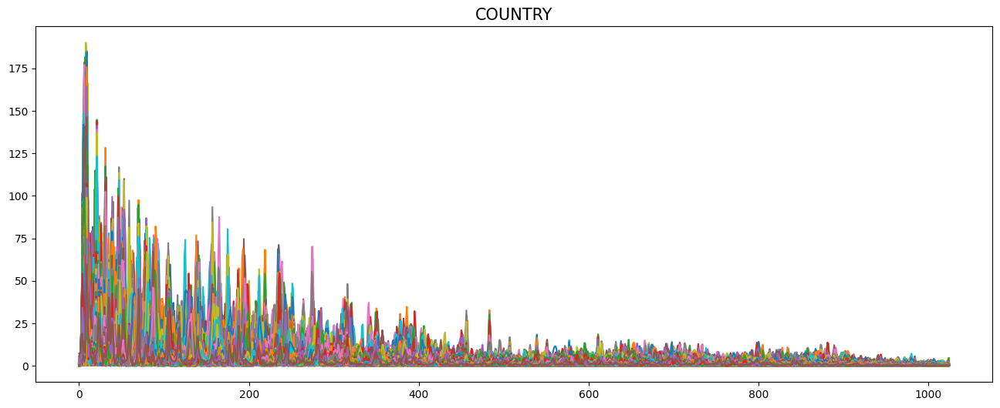

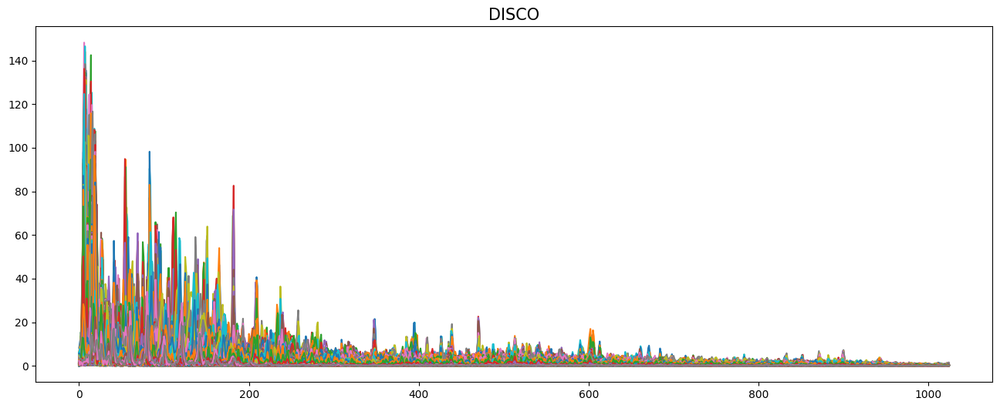

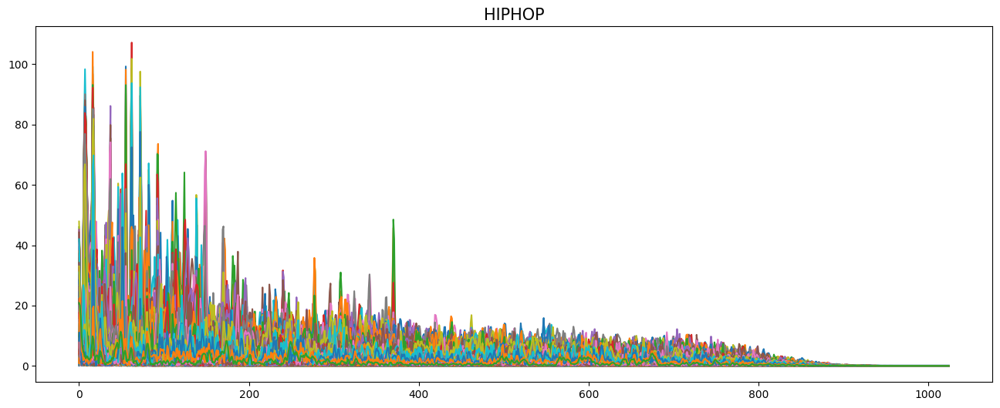

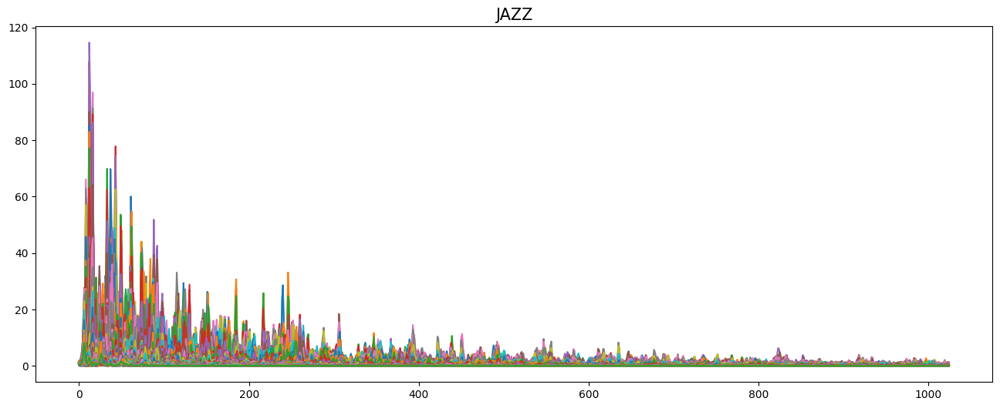

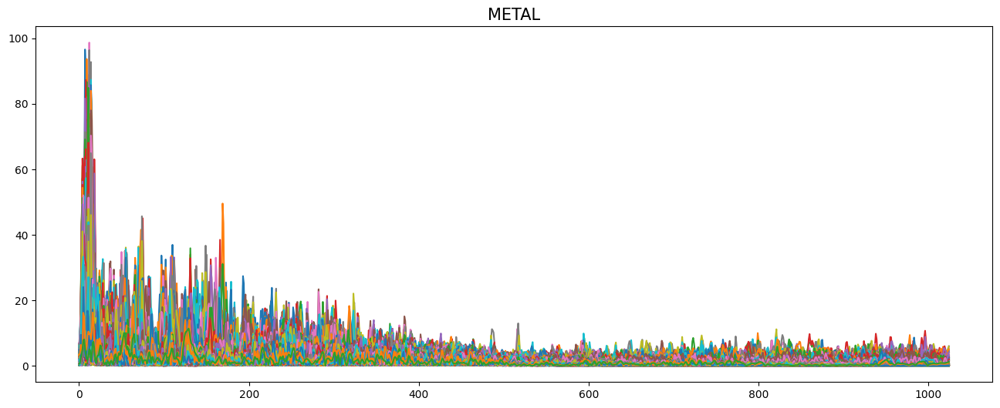

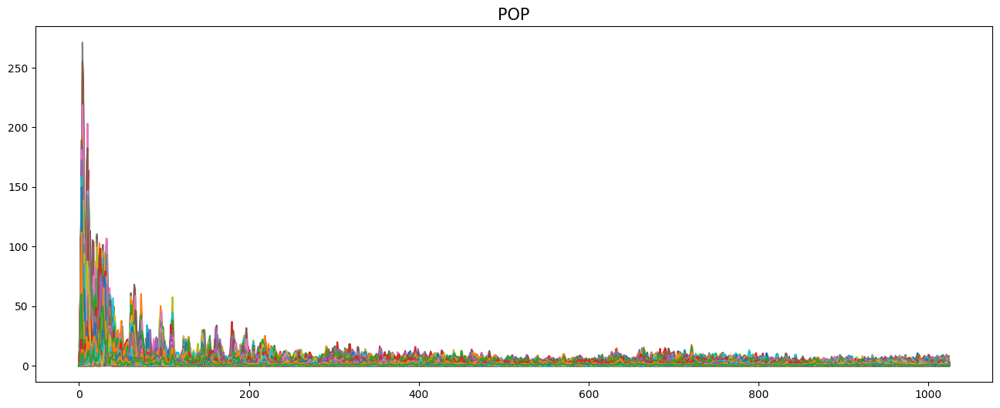

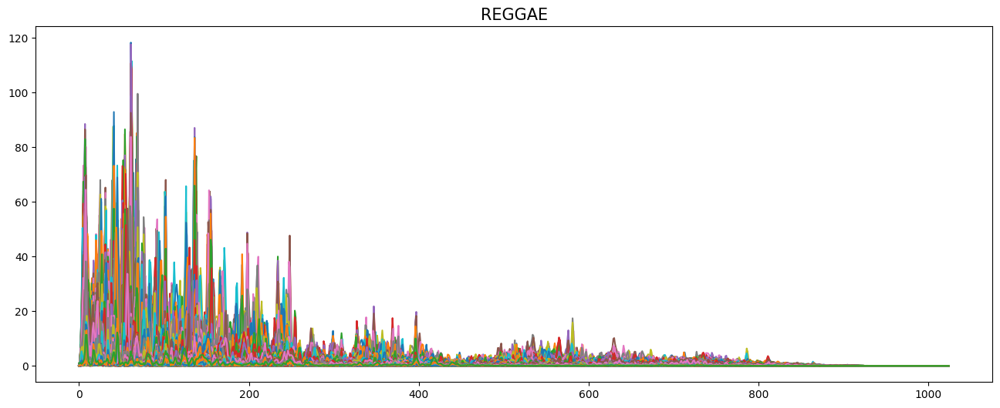

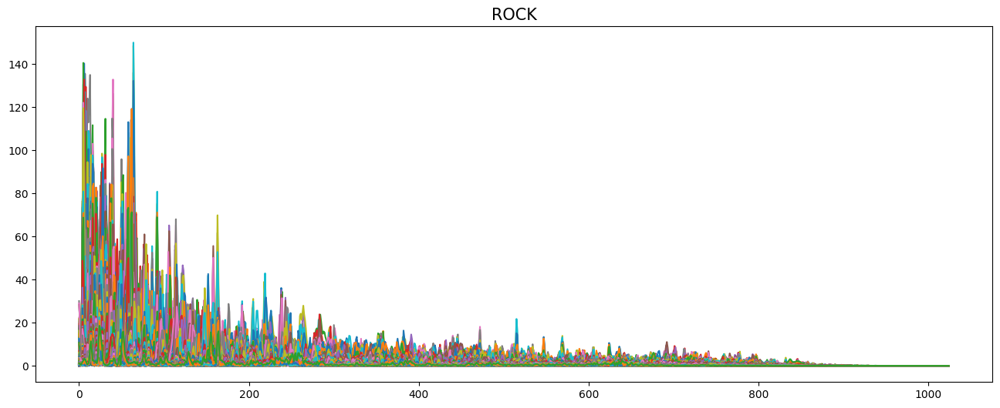

In [10]:
# Performing Short-time Fourier Transform and plotting it
fourier_transforms = [np.abs(librosa.stft(a[0])) for a in audios]
for ft, g in zip(fourier_transforms, genres):
    plt.figure(figsize=(16,6))
    plt.plot(ft)
    plt.title(f"{g}".upper(), fontsize=15)

### Spectrogram<sup>__[4]__<sup>

* A spectrogram is a visual representation of the spectrum of frequencies of a signal as it varies with time. 
* A spectrogram shows the frequencies that make up the sound, from low to high, and how they change over time, from left to right.<br>
* When applied to an audio signal, spectrograms are sometimes called sonographs similar to a sonography that uses high-frequency sound waves to produce visual images of organs, tissues, or blood. flow inside the body. <br><br>
    
Spectrogram visualization helps in identifying patterns, understanding the characteristics of the audio signal, and detecting specific events or features such as harmonics, transients, or noise.

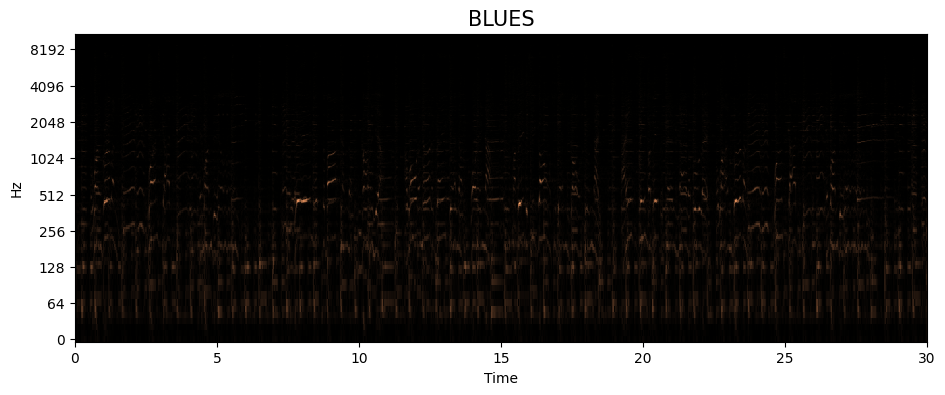

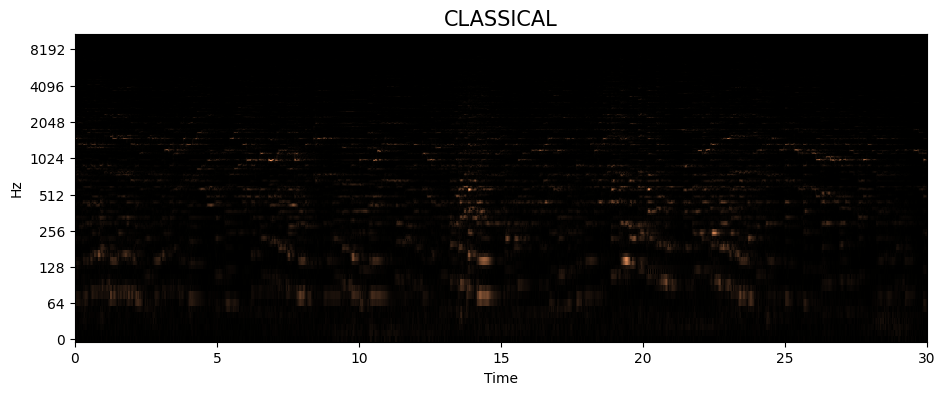

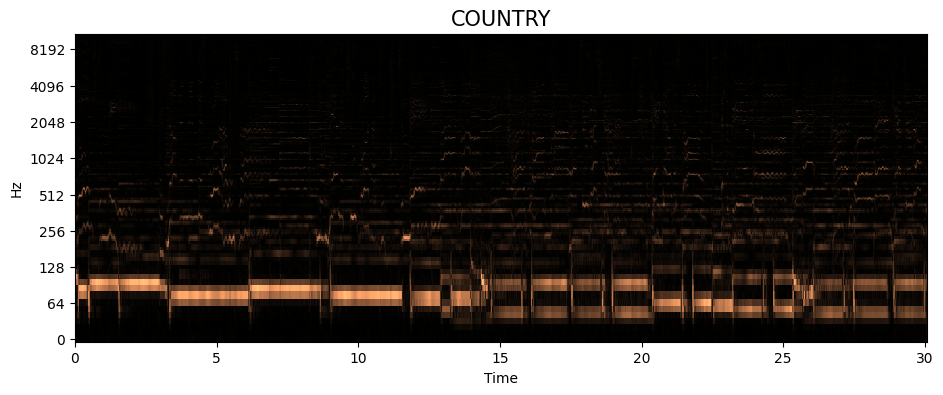

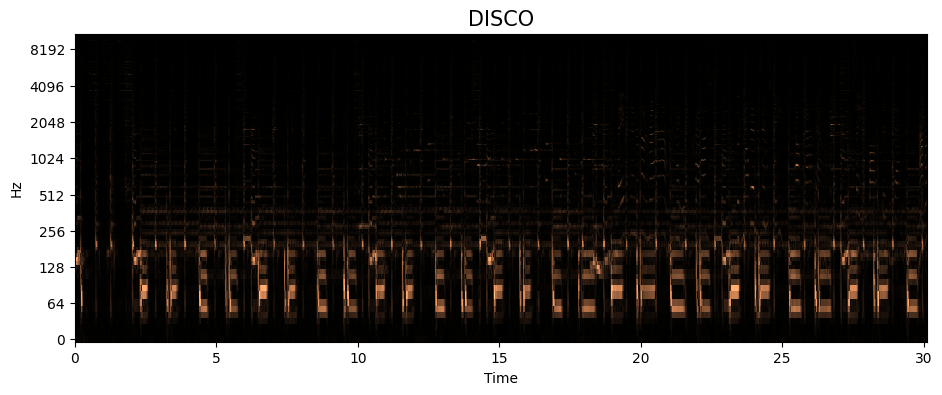

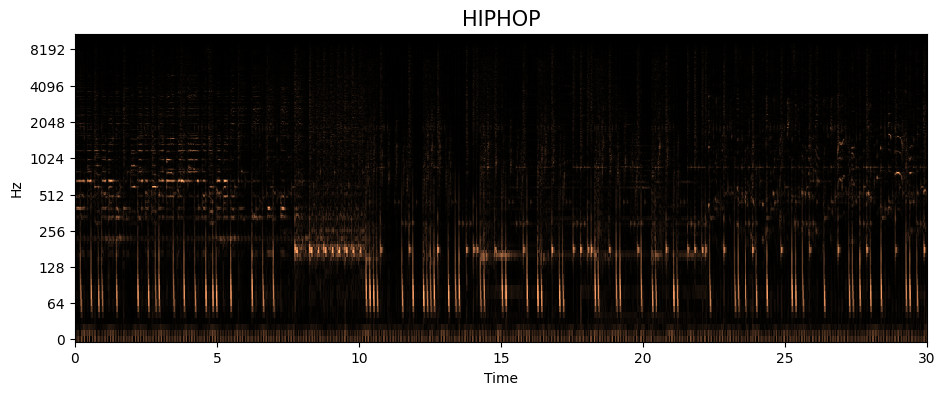

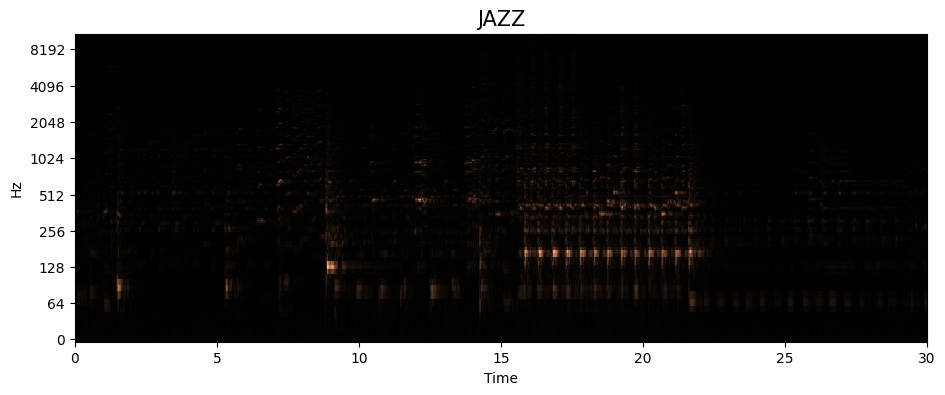

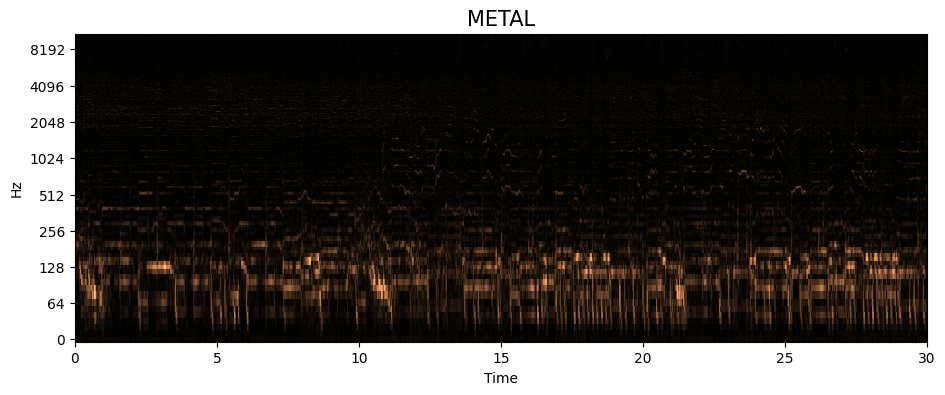

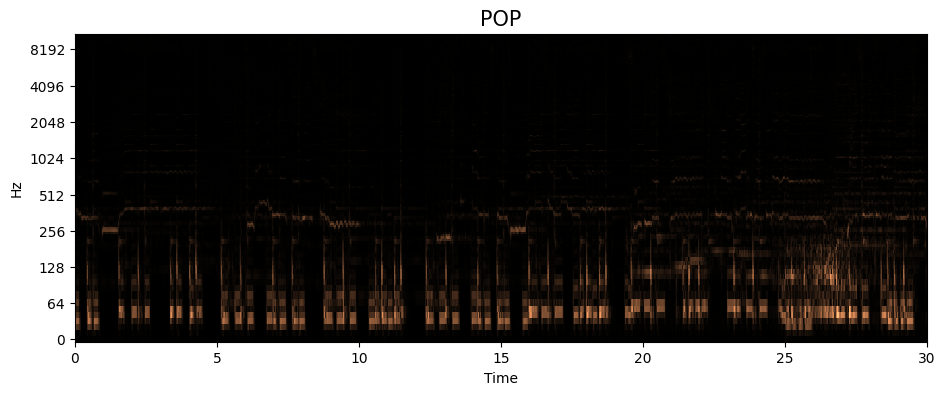

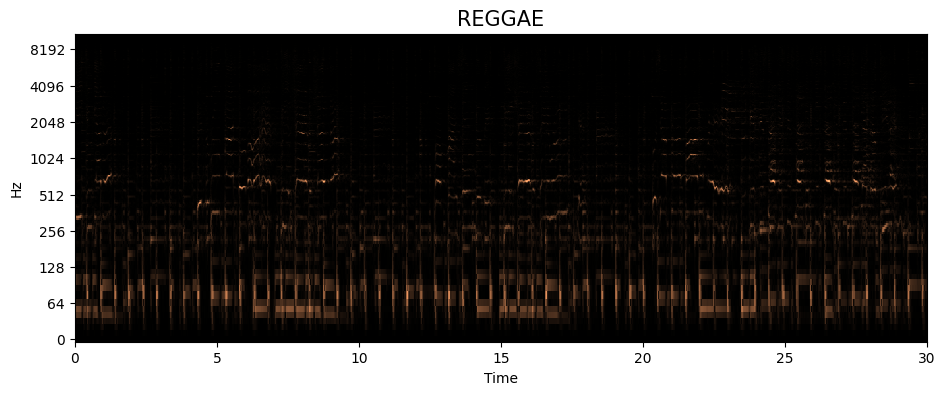

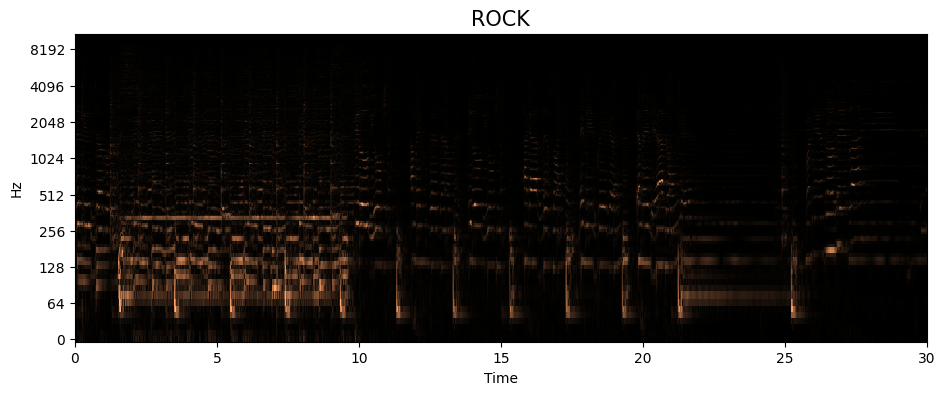

In [11]:
# Plotting the spectrograms of all the genres
for g, ft in zip(genres, fourier_transforms):
    plt.figure(figsize=(11, 4))
    librosa.display.specshow(ft, x_axis='time', y_axis='log', cmap='copper')
    plt.title(f"{g}".upper(), fontsize=15)

<br><br>
The above spectrogram doesn't show much, so, we need to convert the audio into decibles.

#### Why there's a need to convert audio signal to decibles before displaying the spectrogram?
Converting the audio signal into decibels before displaying the spectrogram is a common preprocessing step in audio signal processing, and it serves a few purposes:<br>
* __Perceptual Sensitivity:__ Human perception of sound intensity is logarithmic, meaning we perceive differences in loudness on a logarithmic scale. By converting the audio signal into decibels, we align the representation with human perception, making it more intuitive to interpret the spectrogram.
* __Normalization:__ Converting the audio signal into decibels often involves normalizing the signal to a reference level, such as 0 dB. This normalization helps in standardizing the representation of different audio signals, making them more comparable and consistent across different recordings.
* __Highlighting Features:__ Converting the audio signal into decibels can highlight certain features of interest in the spectrogram, such as faint sounds in the presence of background noise or subtle changes in intensity over time.

Overall, converting the audio signal into decibels before displaying the spectrogram helps in improving the clarity, interpretability, and perceptual relevance of the spectrogram representation.
Also, here we will convert the frequency axis to logarithmic scale.
<br><br>

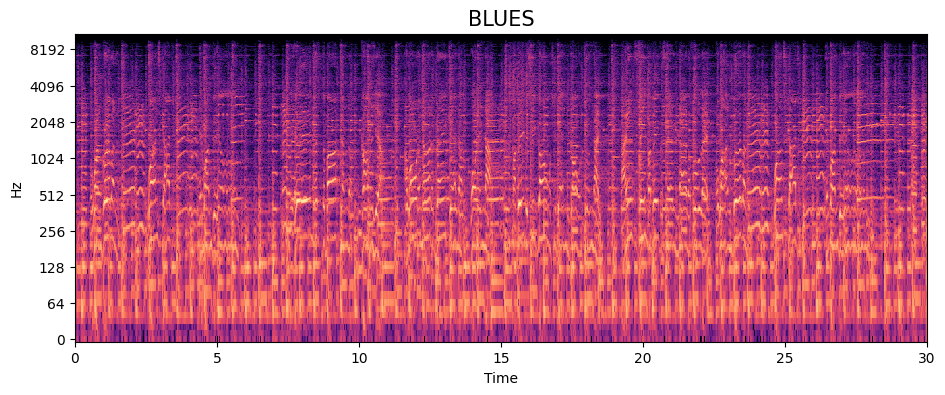

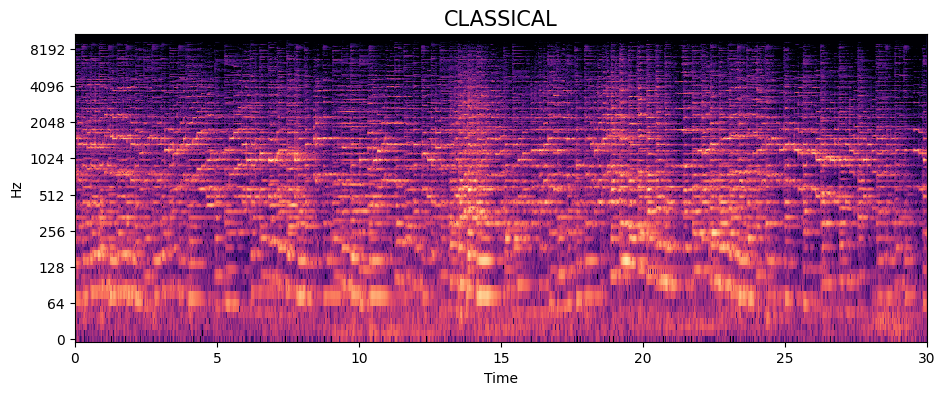

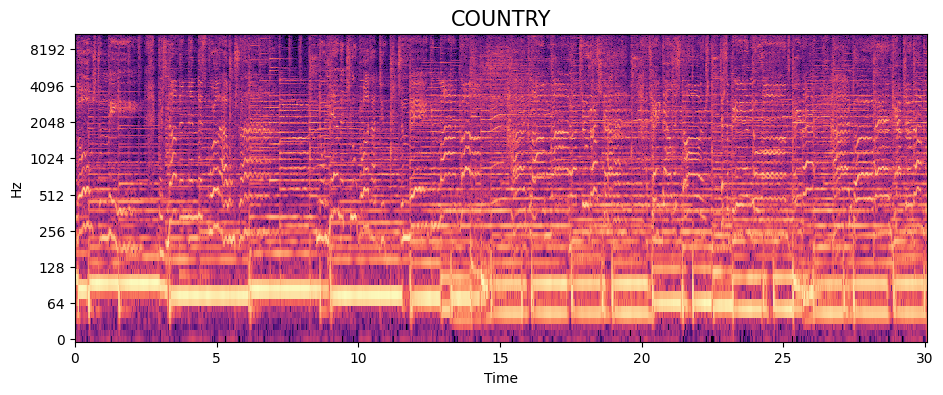

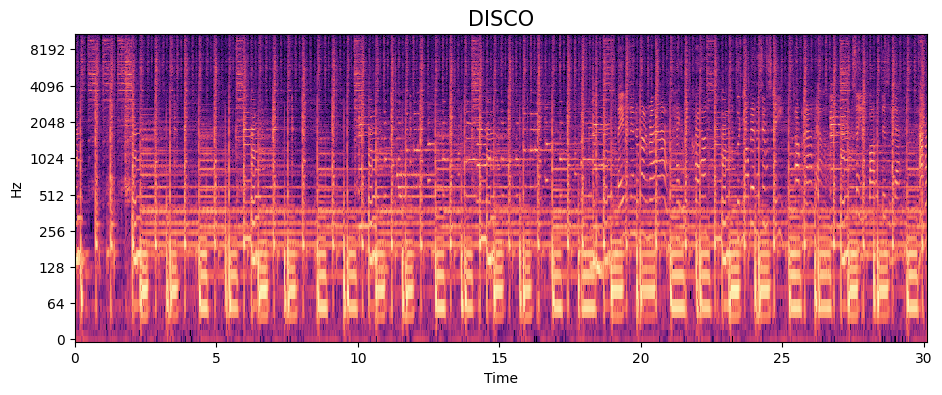

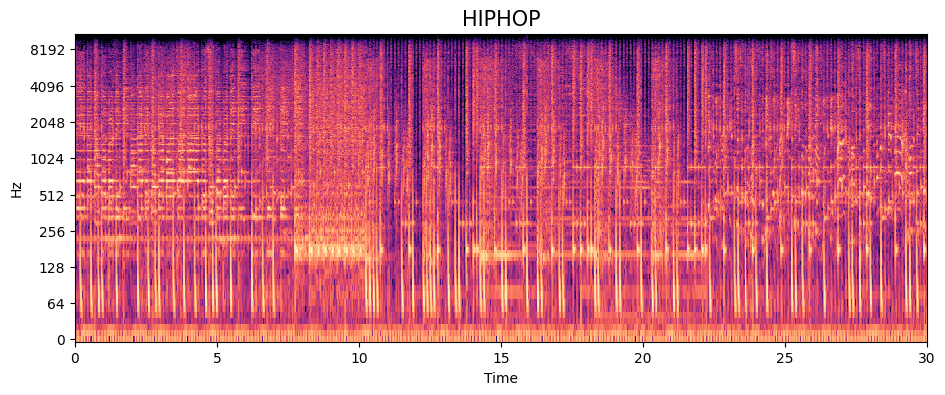

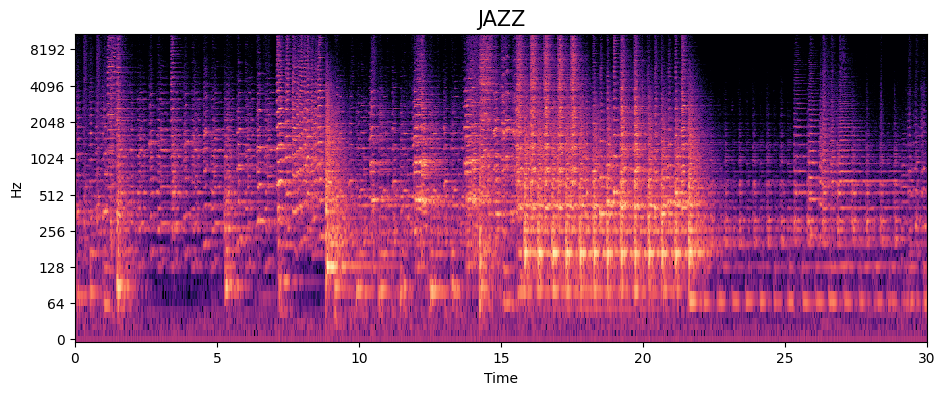

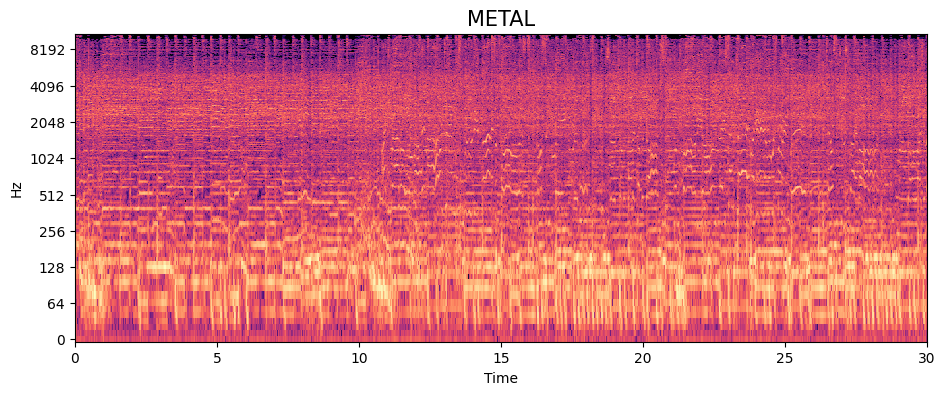

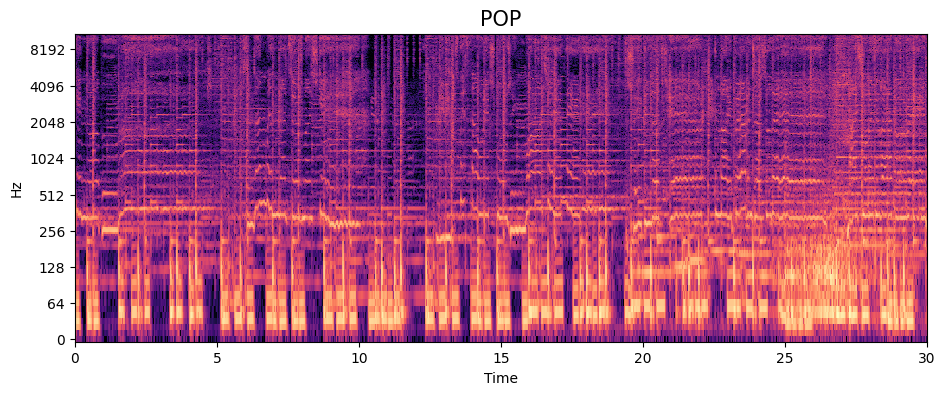

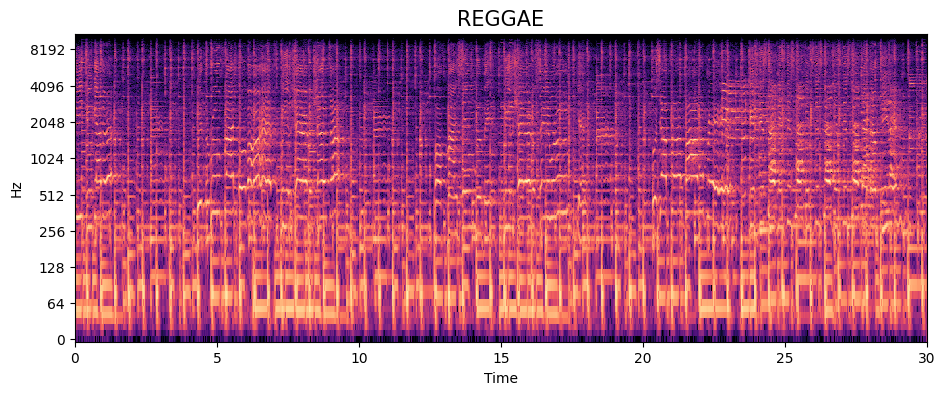

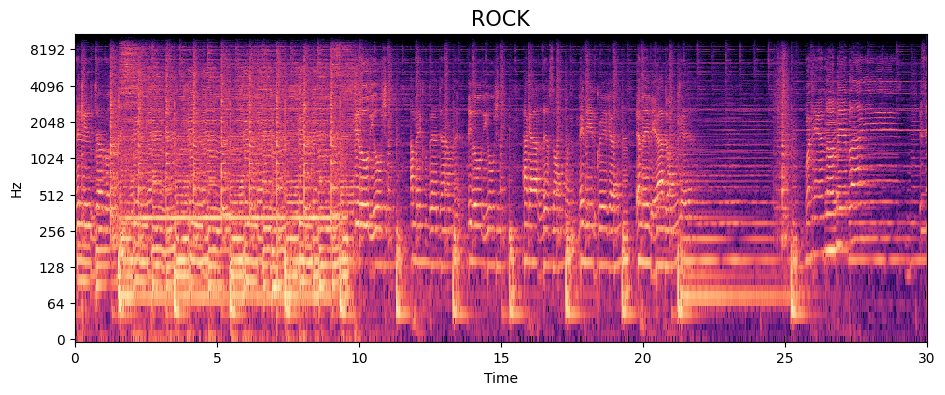

In [12]:
# Converting the the audio file from amplitude to decibles and plotting the spectrogram of all the genres
for g, ft in zip(genres, fourier_transforms):
    plt.figure(figsize=(11, 4))
    librosa.display.specshow(librosa.amplitude_to_db(ft, ref=np.max), x_axis='time', y_axis='log')
    plt.title(f"{g}".upper(), fontsize=15)

### Mel Spectrogram

#### The Mel Scale<sup>[5]</sup>
Humans do not perceive frequencies on a linear scale. We are better at detecting differences in lower frequencies than higher frequencies. For example, we can easily tell the difference between 500 and 1000 Hz, but we will hardly be able to tell a difference between 10,000 and 10,500 Hz, even though the distance between the two pairs are the same.
<br><br>
In 1937, Stevens, Volkmann, and Newmann proposed a unit of pitch such that equal distances in pitch sounded equally distant to the listener. This is called the __Mel Scale.__<br></br>

A ___Mel Spectrogram___ is a spectrogram where the frequencies are converted to the mel scale.

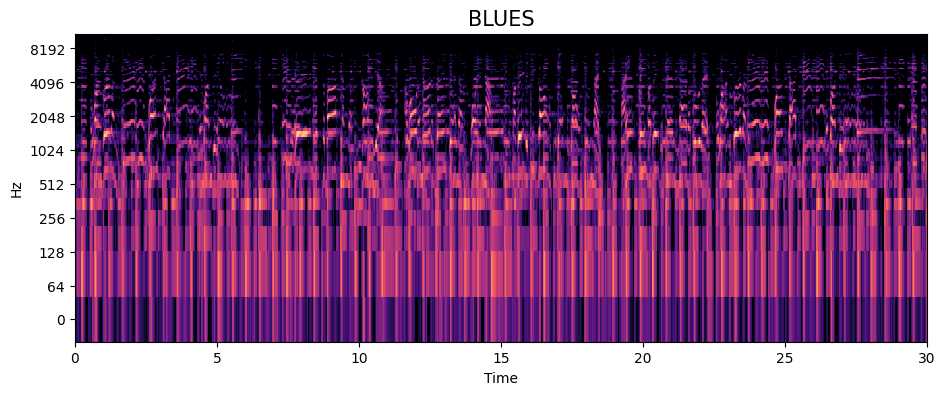

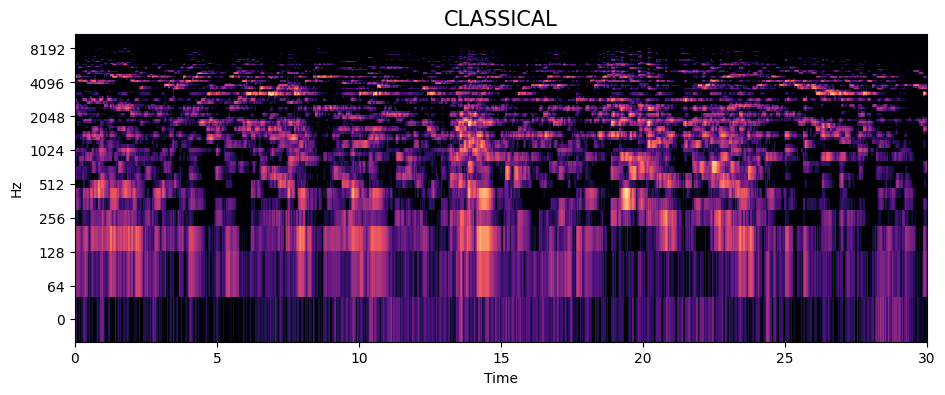

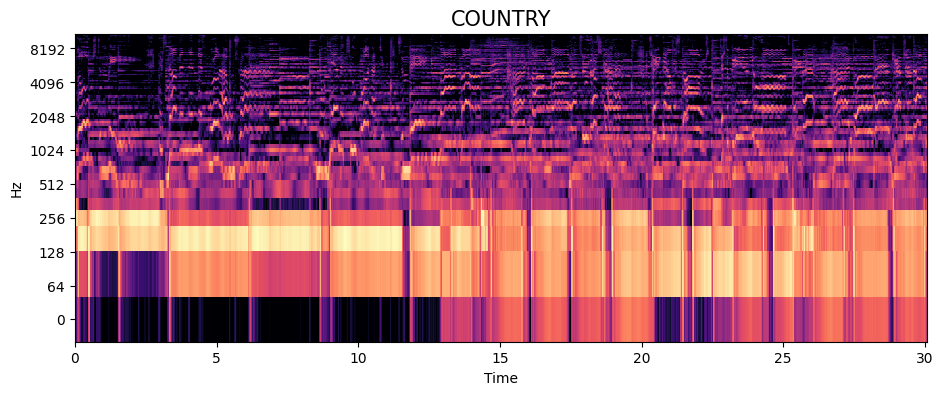

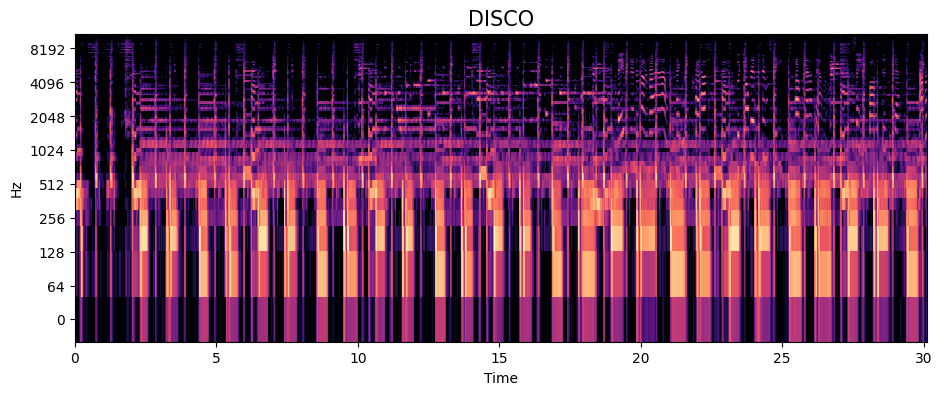

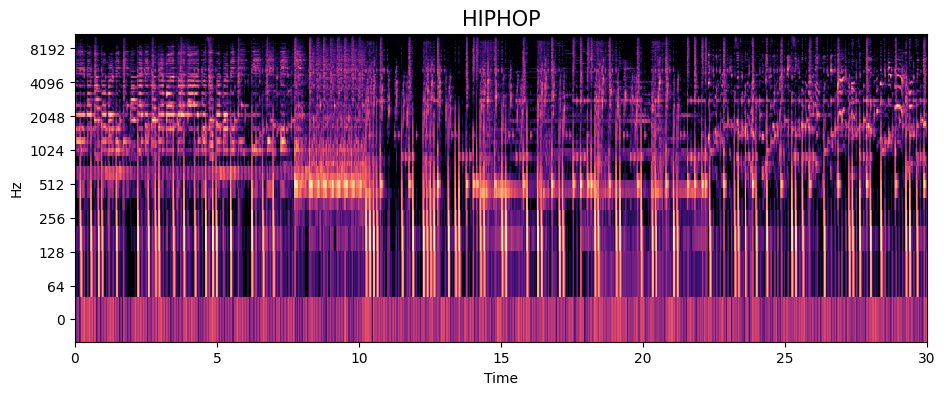

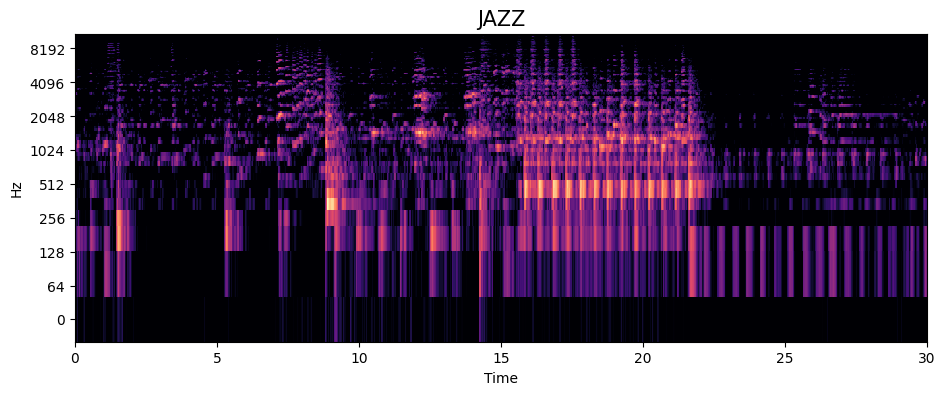

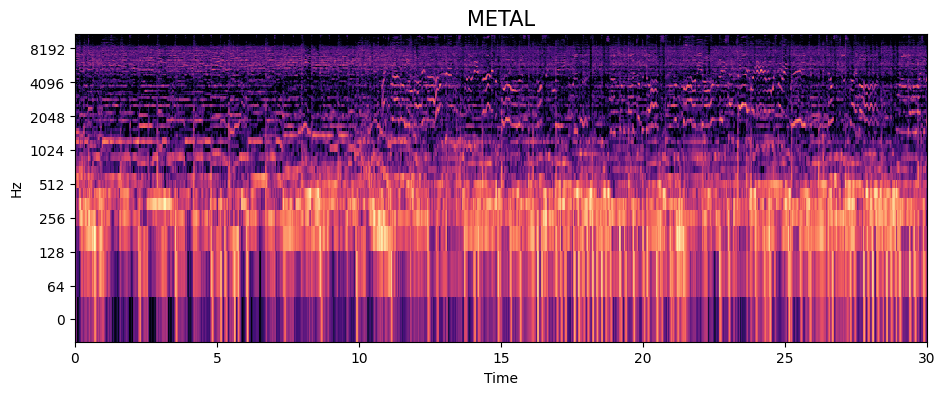

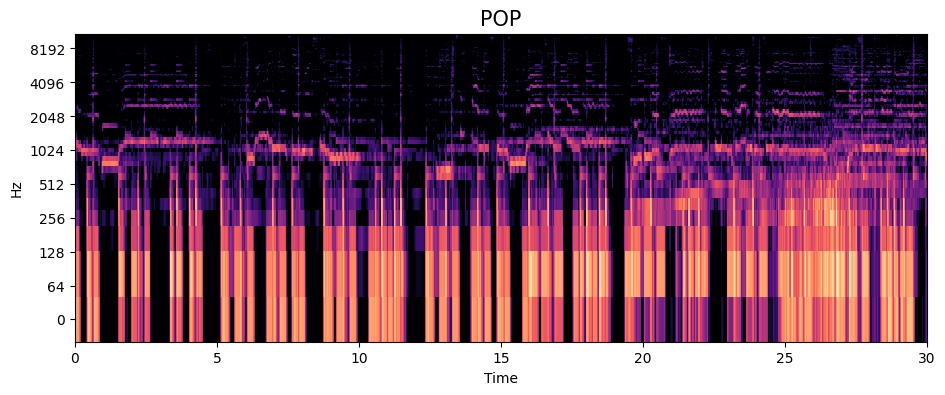

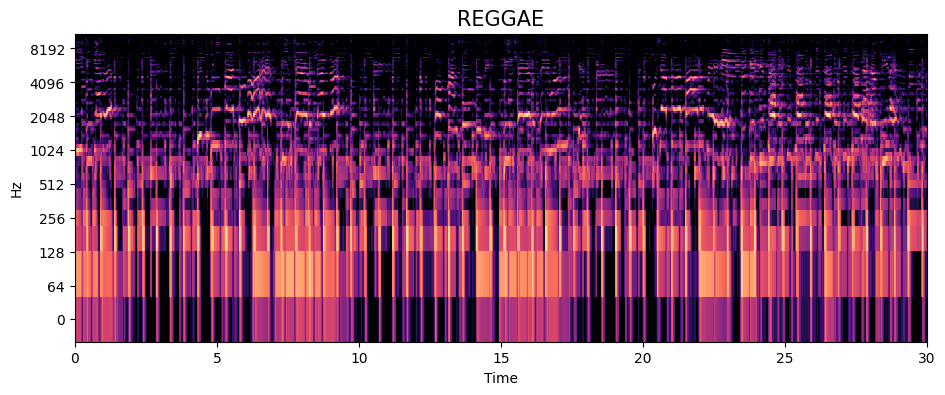

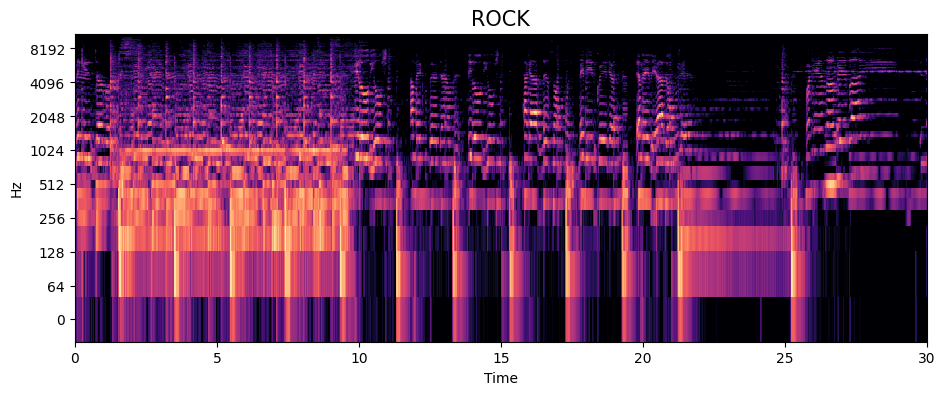

In [13]:
# Converting the audio into mel scale and displaying the mel spectrogram
for a, g in zip(audios, genres):
    plt.figure(figsize=(11, 4))
    mel_spect = librosa.feature.melspectrogram(y=a[0], sr=a[1])
    mel_spect = librosa.amplitude_to_db(mel_spect, ref=np.max)
    librosa.display.specshow(mel_spect, y_axis='log', x_axis='time', hop_length=512);
    plt.title('Mel Spectrogram');
    plt.title(f"{g}".upper(), fontsize=15)




### Zero Crossing Rate

The zero-crossing rate (ZCR) is the rate at which a signal changes from positive to zero to negative or vice-versa.<sup>__[6]__</sup>
The zero crossing rate (ZCR) is a feature commonly used in audio signal processing that measures the rate at which the audio waveform changes its sign (crosses the zero amplitude axis) within a given time frame.<br><br>

#### What is the need of the Zero Crossing Rate?<sup>__[3]__</sup>
1. __Music Genre Classification:__ Zero crossing rate can also be used as a feature for classifying music genres. Different music genres often have distinct rhythmic characteristics that are reflected in their zero crossing rates. For example, genres like classical music tend to have lower zero crossing rates compared to genres like rock or metal.
2. __Pitch Detection:__ In music analysis, zero crossing rate can be used as a feature for pitch detection. Periodic signals, such as those produced by musical instruments, tend to have regular patterns of zero crossings corresponding to their fundamental frequency. Analyzing the zero crossing rate can help in estimating the pitch or fundamental frequency of such signals.

Overall, zero crossing rate provides valuable information about the temporal characteristics of audio signals and can be used as a feature for various audio processing tasks, including speech and music analysis, classification, and effects processing.

Text(0.5, 1.0, 'Zero-Crossings of all the Genres')

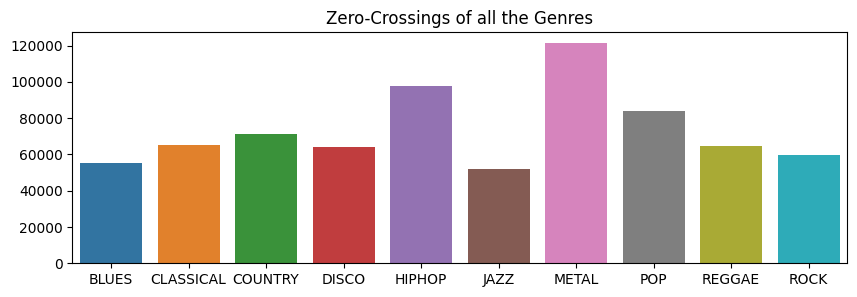

In [14]:
genre_zero_crossings = [librosa.zero_crossings(a[0], pad=False) for a in audios]
plt.figure(figsize=(10, 3))
sns.barplot(y=[sum(zc) for zc in genre_zero_crossings], x=[g.upper() for g in genres])
plt.title('Zero-Crossings of all the Genres')

Since ___Metal___ music has lots of beats, it has highest zero crossings on contrary ___Jazz___ music is calm and has var less beats so, it has lowest zero crossings.<br></br>
Let's verify by plotting

Zero Crossings: 20


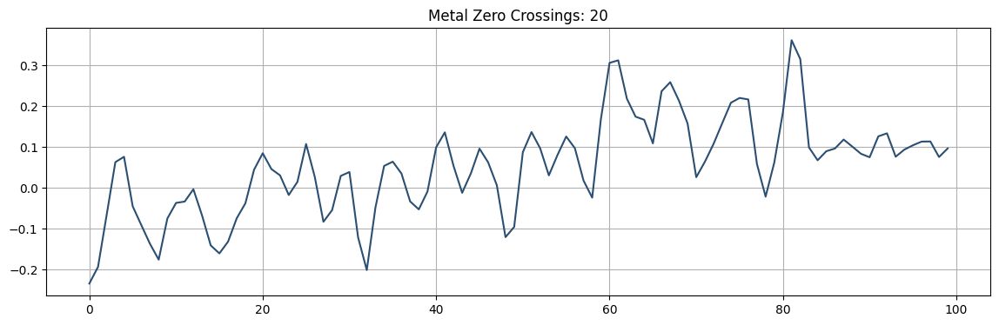

In [15]:
# Plotting ZCR of 'Metal' genre

# Zooming between 9000 - 9100 samples
n0 = 9000
n1 = 9100
metal_audio = audios[-4][0]
print("Zero Crossings:",sum(librosa.zero_crossings(y=metal_audio[n0:n1])))
plt.figure(figsize=(14, 4))
plt.plot(metal_audio[n0:n1], color="#2B4F72")
plt.title('Metal Zero Crossings: {}'.format(sum(librosa.zero_crossings(y=metal_audio[n0:n1]))))
plt.grid()

Zero Crossings: 13


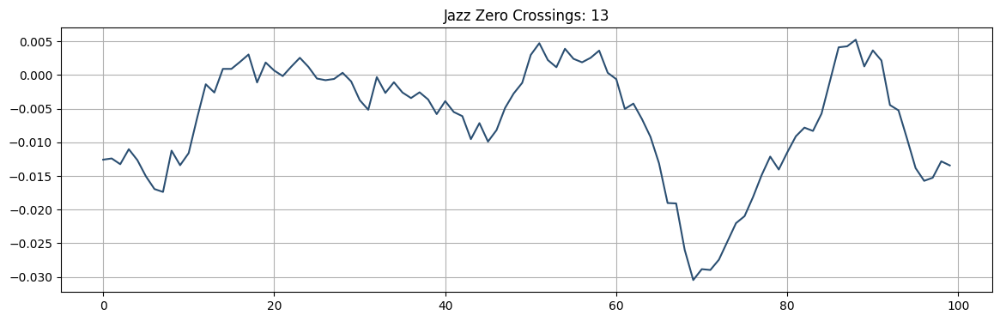

In [16]:
# Plotting ZCR of 'Jazz' genre

# Zooming between 9000 - 9100 samples
n0 = 9000
n1 = 9100
jazz_audio = audios[-5][0]
print("Zero Crossings:",sum(librosa.zero_crossings(y=jazz_audio[n0:n1])))
plt.figure(figsize=(14, 4))
plt.plot(jazz_audio[n0:n1], color="#2B4F72")
plt.title('Jazz Zero Crossings: {}'.format(sum(librosa.zero_crossings(y=jazz_audio[n0:n1]))))
plt.grid()

### Tempo

Tempo is the Beats Per Minute(BPM). The tempo of a musical piece influences its overall feel, energy, and mood. Different tempos can evoke different emotions and convey different musical styles like Fast Tempo, Moderate Tempo & Slow Tempo.

Text(0, 0.5, 'Tempo')

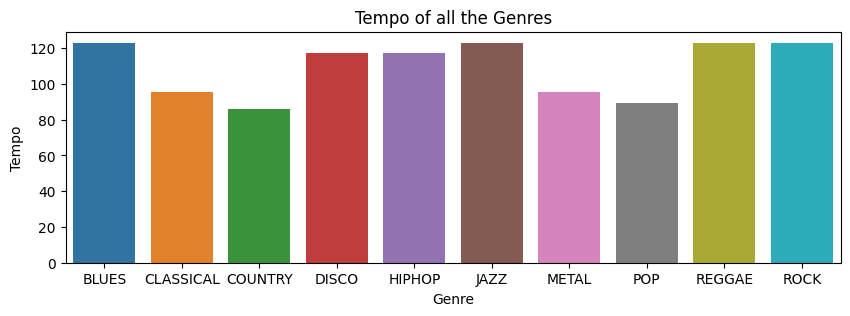

In [17]:
# Getting tempo of all the genres and plotting a bar chart
genre_tempos = [librosa.beat.beat_track(y=a[0], sr=a[1])[0] for a in audios]
plt.figure(figsize=(10, 3))
sns.barplot(y=genre_tempos, x=[g.upper() for g in genres])
plt.title('Tempo of all the Genres')
plt.xlabel('Genre')
plt.ylabel('Tempo')

###  Harmony and Percussion<sup>[7]</sup>

We consider two broad categories of sounds: harmonic sounds and percussive sounds.<br>

__Harmonic Sound__
* A _Harmonic Sound_ is what we perceive as pitched sound, what makes us hear melodies and chords.
* It corresponds to a horizontal line in a spectrogram representation.
* The sound of a violin is a typical example of what we consider a Harmonic Sound.

__Percussive Sound__
* A Percussive Sound is what we perceive as a clash, a knock, a clap, or a click.
* It corresponds to vertical line in a spectrogram representation.
* The sound of a drum stroke is a typical example of Percussive Sound.

Overall, separating Harmonic and Percussive components in audio signals can provide valuable insights into the structural, timbral, and rhythmic characteristics of music, which can enhance the performance of genre classification algorithms by capturing genre-specific patterns more effectively.

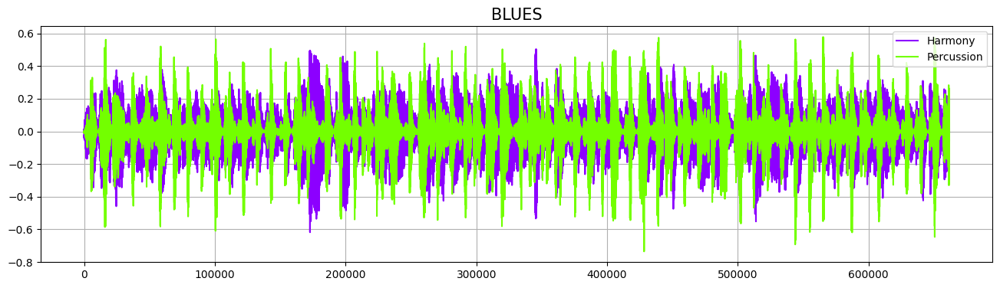

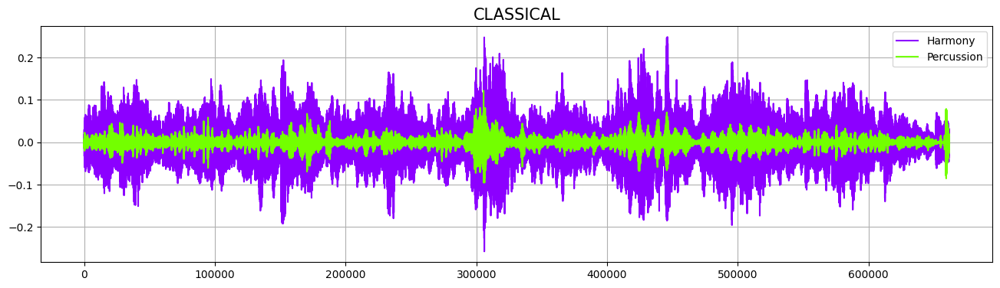

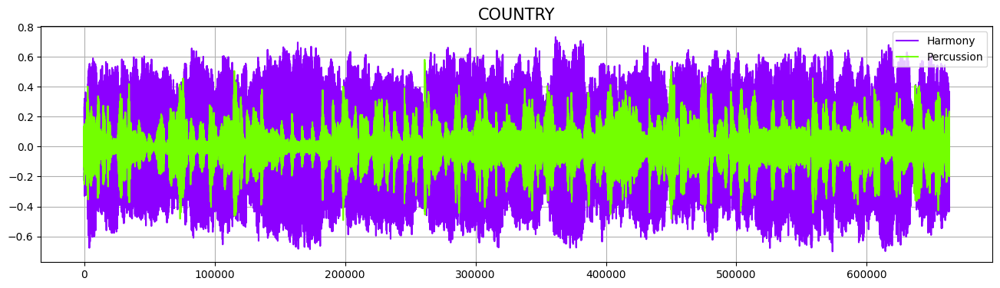

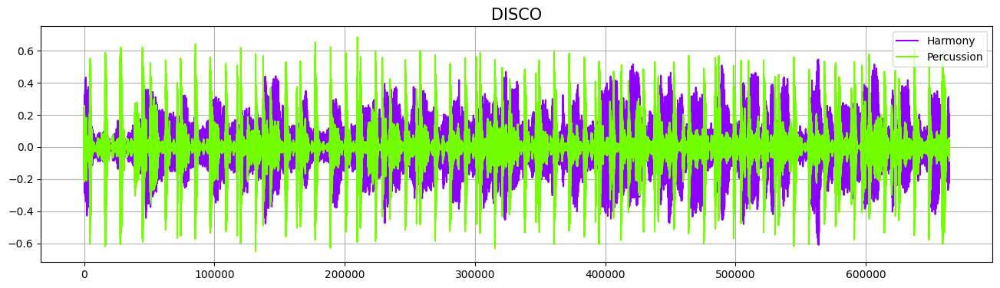

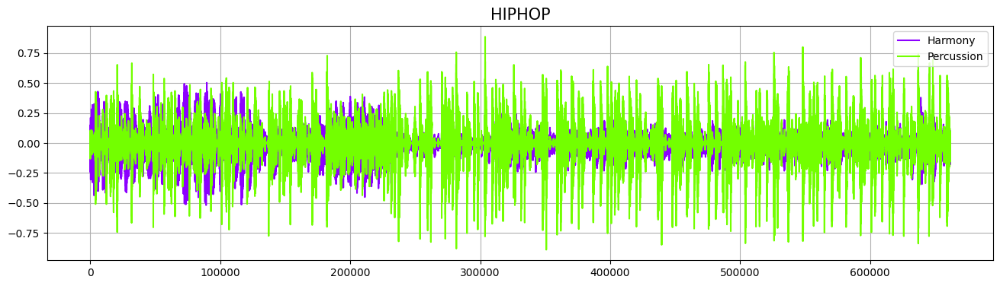

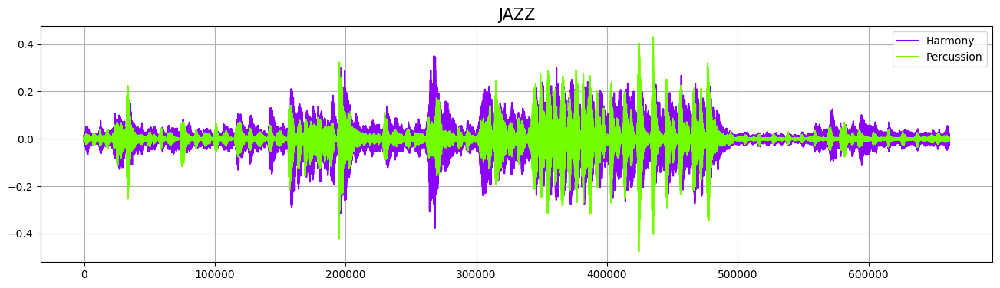

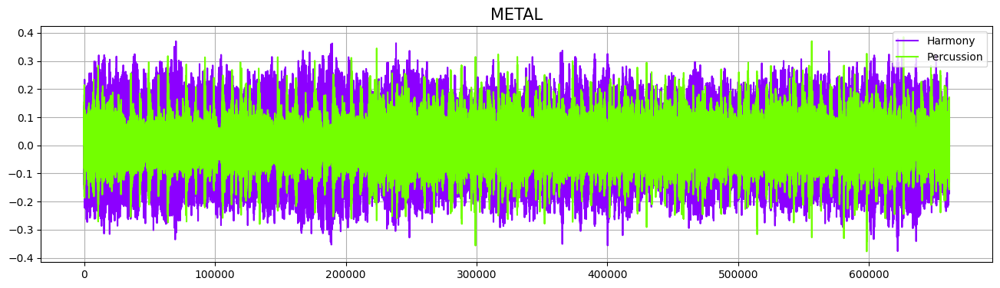

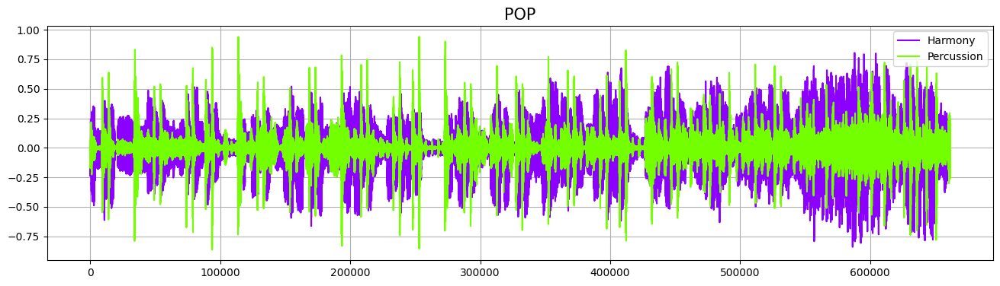

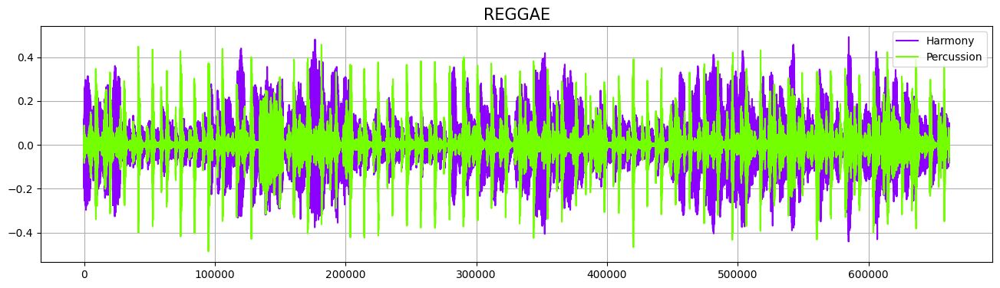

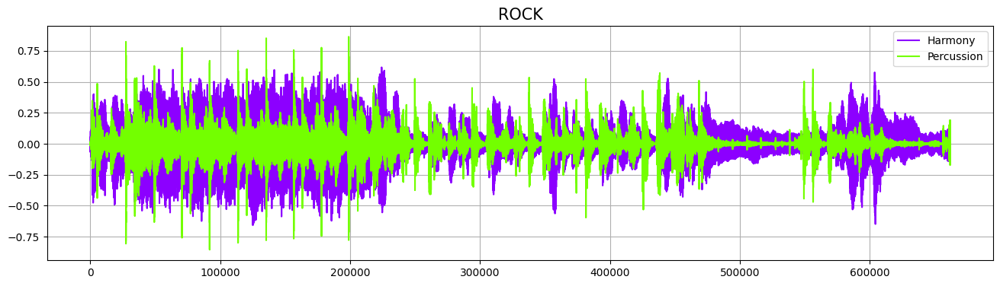

In [18]:
# Getting the Harmonics and Percussive components of an audio and plotting it
for a, g in zip(audios, genres):
    y_harm, y_perc = librosa.effects.hpss(a[0])
    plt.figure(figsize = (16, 4))
    plt.plot(y_harm, color = '#8C00FF', label='Harmony');
    plt.plot(y_perc, color = '#73ff00', label='Percussion');
    plt.title(f"{g}".upper(), fontsize=15)
    plt.legend(loc='upper right')
    plt.grid()

## Spectral Features of an Audio

### Spectral Centroid<sup>[3]</sup>
The spectral centroid is a measure used in digital signal processing and music analysis to describe the "center of mass" or average frequency of a sound. Mathematically, it is the weighted mean of the frequencies present in the signal, where each frequency value is weighted by its amplitude or magnitude. It provides valuable information about the spectral distribution of energy within the signal. <br><br>

Spectral Centroid provides valuable information about the spectral characteristics of audio signals, which can be leveraged for analyzing timbral qualities, instrumentation, and genre-specific patterns in music. It serves as an effective feature for music genre classification algorithms, helping to differentiate between different genres based on their spectral content.

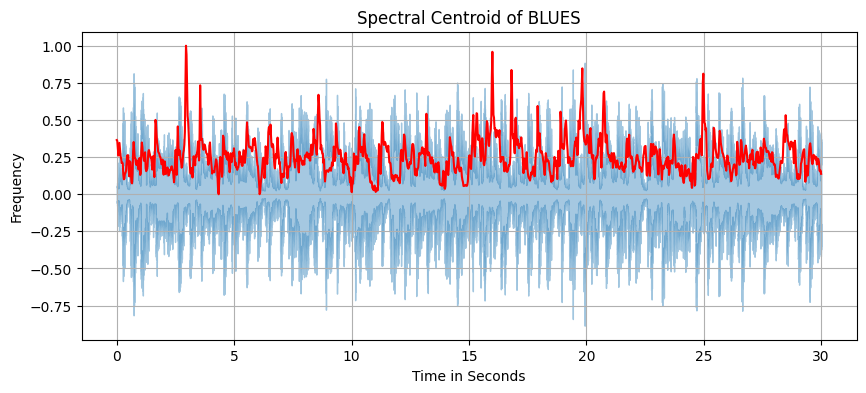

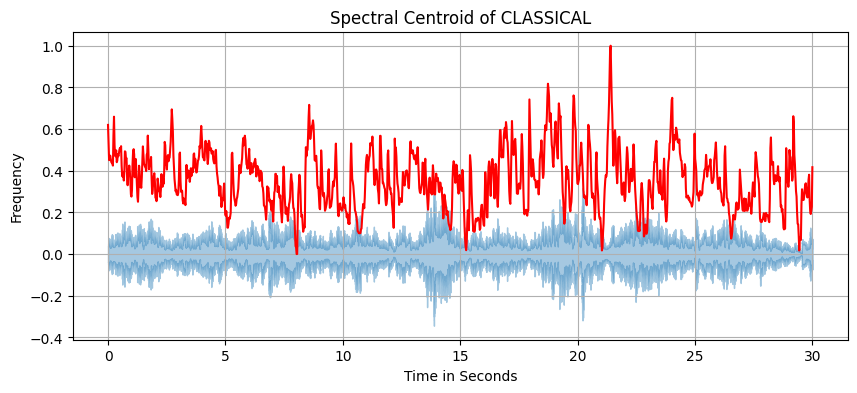

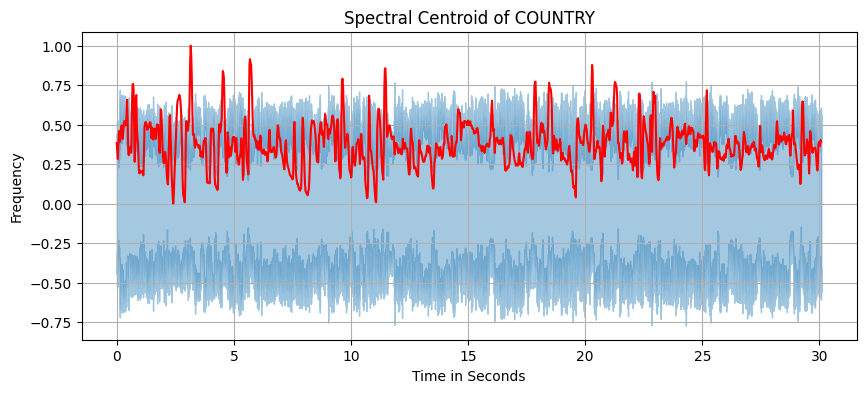

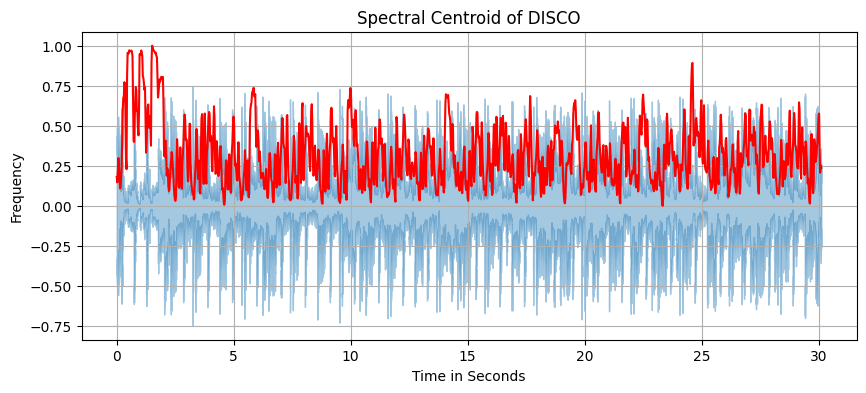

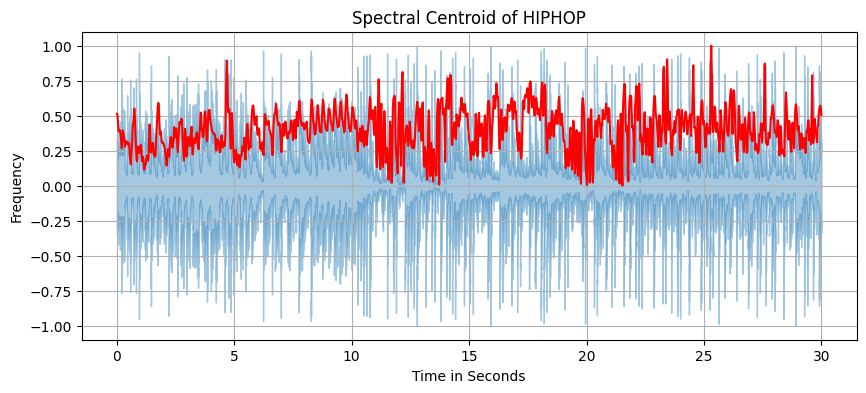

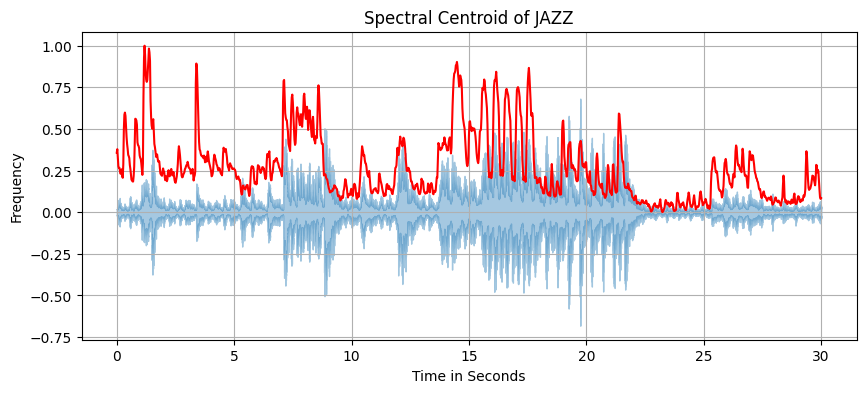

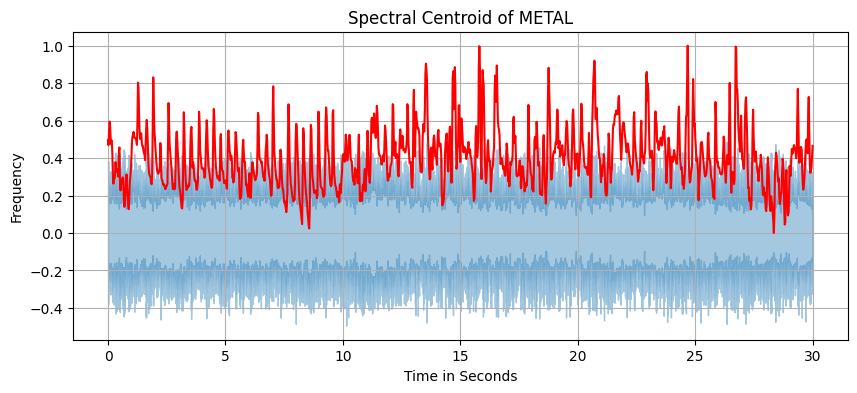

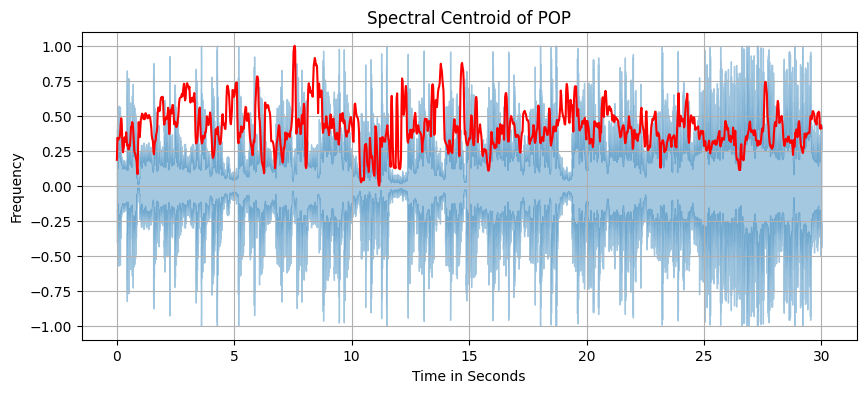

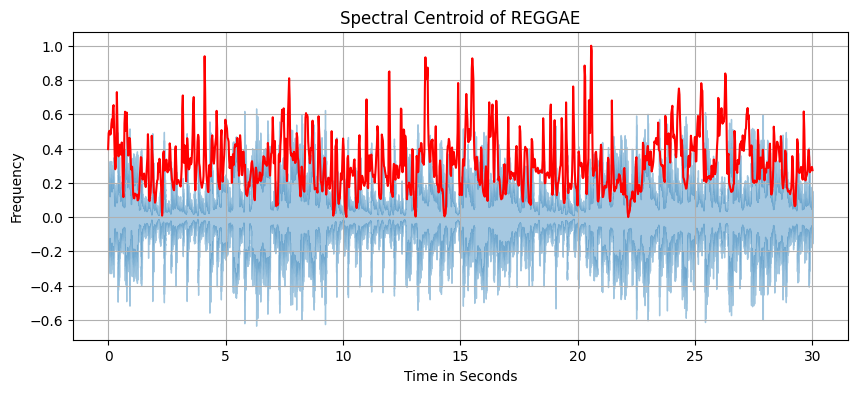

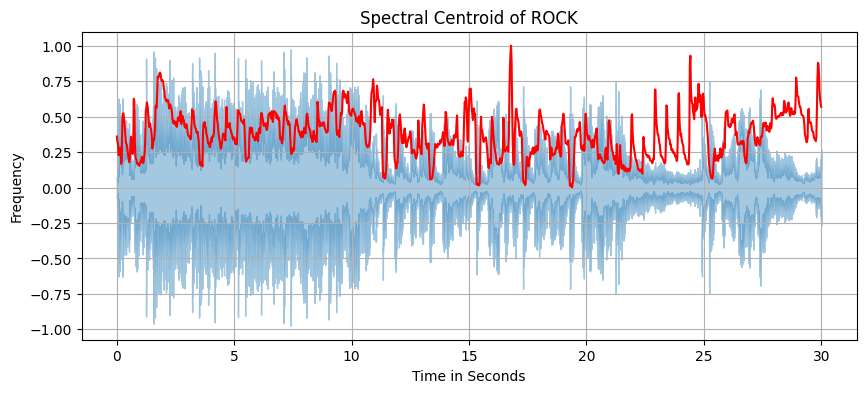

In [19]:
# Extracting the spectral centroids from the audio

for g, a in zip(genres, audios):
    # Calculate the spectral centroid
    spectral_centroid = librosa.feature.spectral_centroid(y=a[0], sr=a[1])[0]
    
    # Create a time axis in seconds
    time = librosa.times_like(spectral_centroid)
    
    # Plotting the spectral centroid over audio waves
    plt.figure(figsize=(10, 4))
    librosa.display.waveshow(a[0], sr=a[1], alpha=0.4)
    plt.plot(time, minmax_scale(spectral_centroid), color='r') # Normalized spectral centroid for visualization
    
    plt.title('Spectral Centroid of {}'.format(g.upper()))
    plt.xlabel('Time in Seconds')
    plt.ylabel('Frequency')
    plt.grid()

### Spectral Rolloff<sup>[3]</sup>
The spectral rolloff of an audio signal is a measure used in digital signal processing and music analysis to characterize the spectral shape or distribution of energy within the signal. It represents the frequency below which a certain percentage of the total spectral energy lies.<br><br>

Spectral rolloff provides valuable information about the spectral shape and distribution of energy within audio signals, which can be leveraged for analyzing timbral qualities, instrumentation, and genre-specific patterns in music. It serves as an effective feature for music genre classification algorithms, helping to differentiate between different genres based on their spectral content.

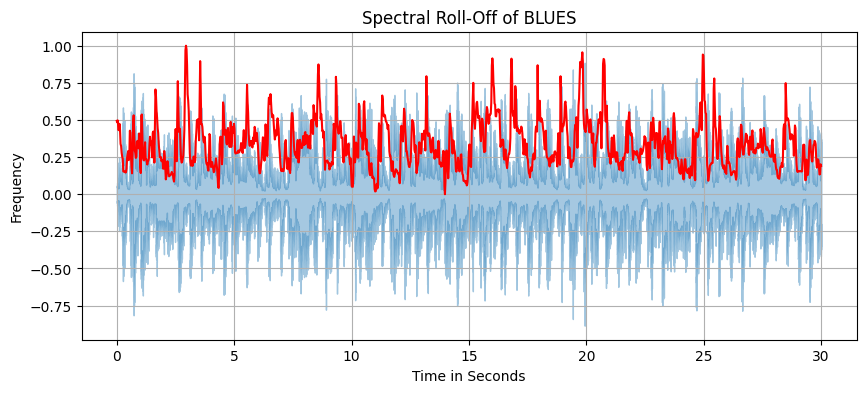

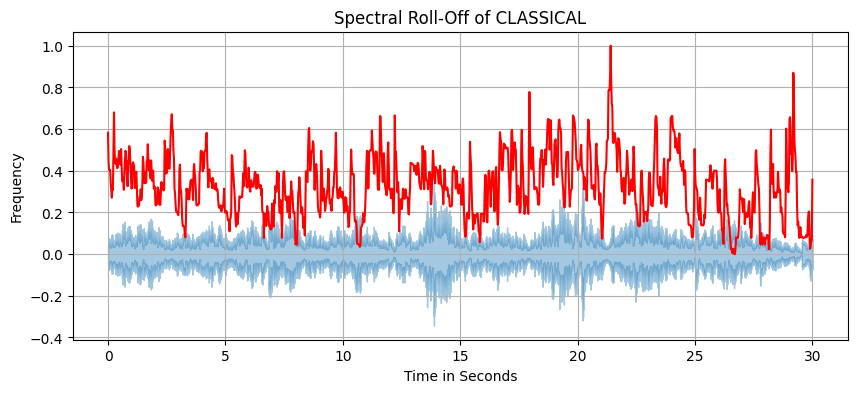

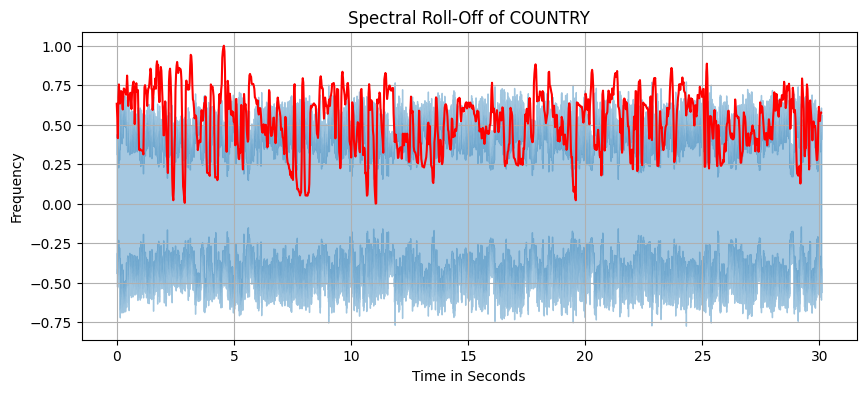

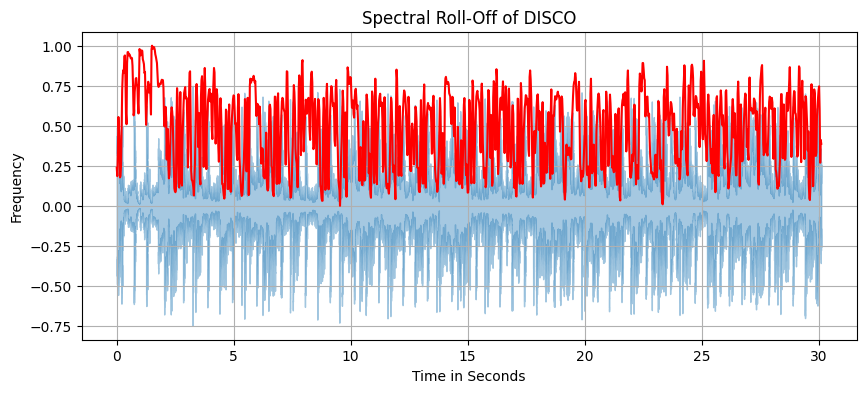

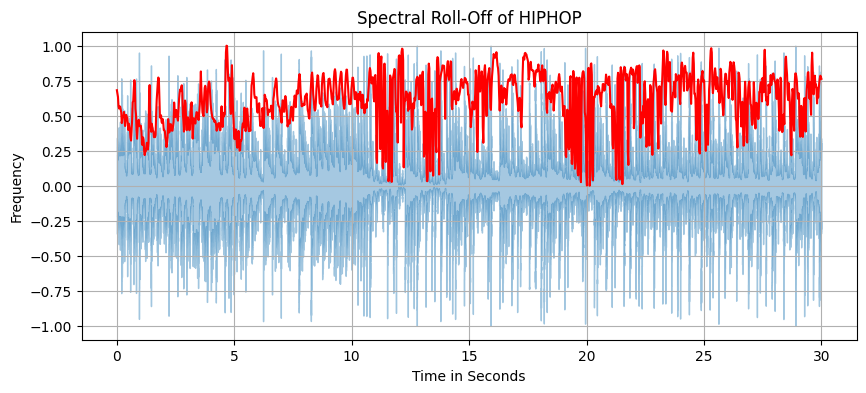

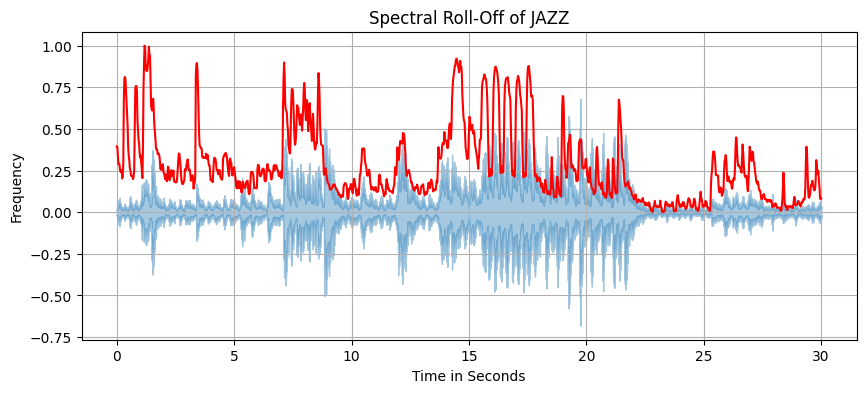

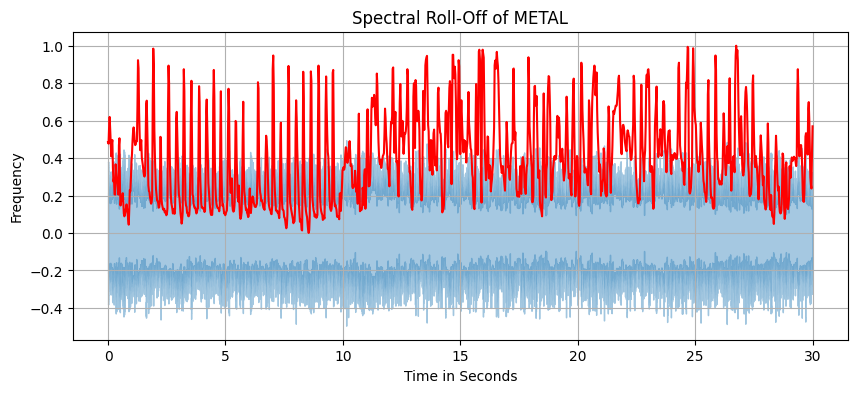

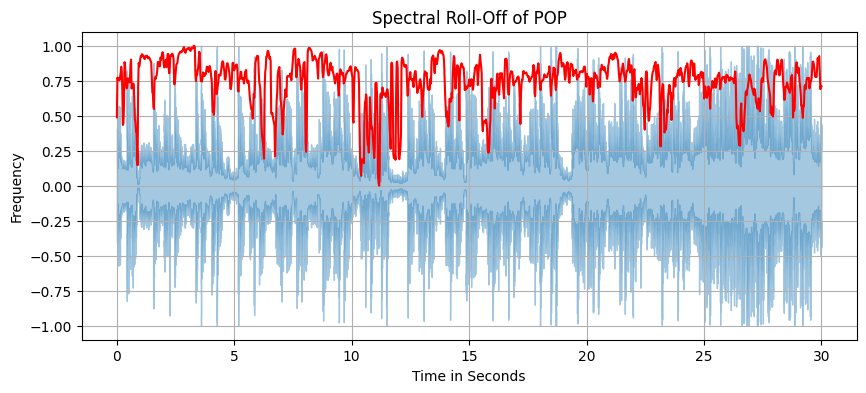

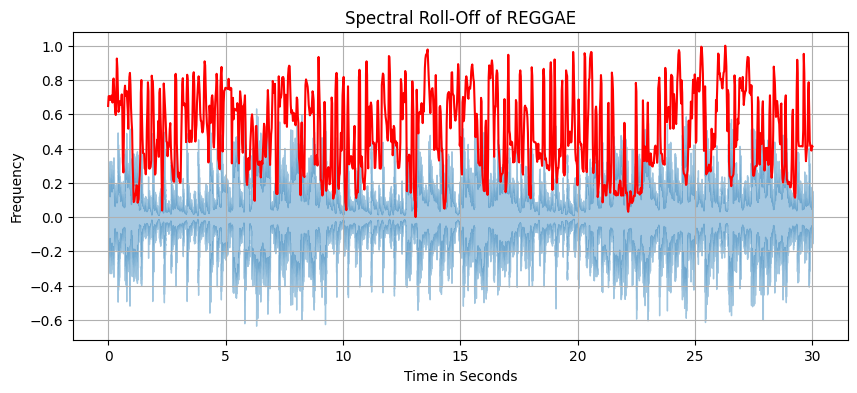

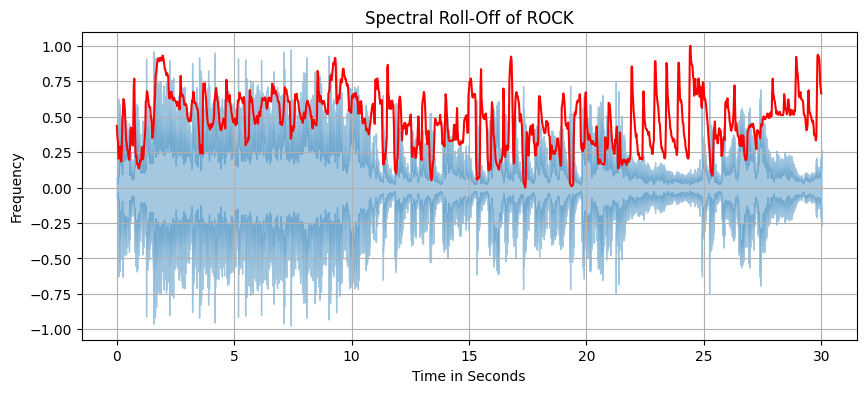

In [20]:
# Extracting the Spectral Rolloffs from the audio
for g, a in zip(genres, audios):
    spectral_centroid = librosa.feature.spectral_centroid(y=a[0], sr=a[1])[0]
    # Create a time axis in seconds
    time = librosa.times_like(X=spectral_centroid)
    
    # Calculating the Spectral Rolloff
    spectral_rolloff = librosa.feature.spectral_rolloff(y=a[0], sr=a[1])[0]

    
    # Plotting the Spectral Rolloff over audio waves
    plt.figure(figsize=(10, 4))
    librosa.display.waveshow(a[0], sr=a[1], alpha=0.4)
    plt.plot(time, minmax_scale(spectral_rolloff), color='r') # Normalized spectral centroid for visualization
    
    plt.title('Spectral Roll-Off of {}'.format(g.upper()))
    plt.xlabel('Time in Seconds')
    plt.ylabel('Frequency')
    plt.grid()

In [21]:
data.columns

Index(['filename', 'length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean',
       'rms_var', 'spectral_centroid_mean', 'spectral_centroid_var',
       'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean',
       'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
       'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var', 'tempo',
       'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean',
       'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',
       'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean',
       'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var',
       'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean',
       'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
       'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean',
       'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var',
  

### Mel-Frequency Cepstral Coefficients<sup>[8]</sup>

MFCCs are a set of coefficients that capture the shape of the power spectrum of a sound signal. They are derived by first transforming the raw audio signal into a frequency domain using Fourier Transform and then applying the mel-scale to approximate the human auditory perception of sound frequency. Finally, cepstral coefficients are computed from the mel-scaled spectrum. <br><br>

MFCCs are used to represent the spectral characteristics of sound in a way that is well-suited for various machine learning tasks. MFCCs are particularly useful because they emphasize features of the audio signal that are important for human speech perception while discarding less relevant information.<br>
Usually MFCC are about 10-20, in this case those are 20.

In [22]:
import warnings
warnings.filterwarnings('ignore')

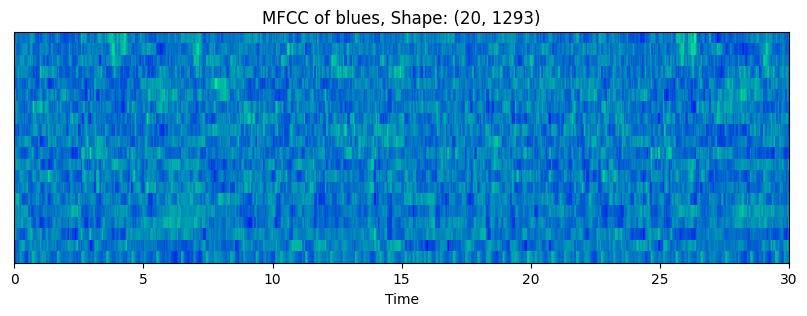

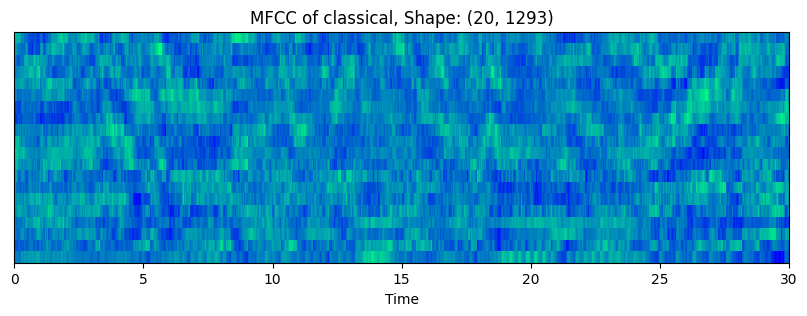

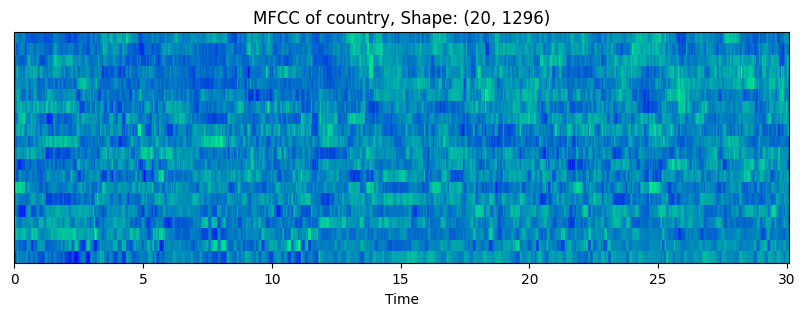

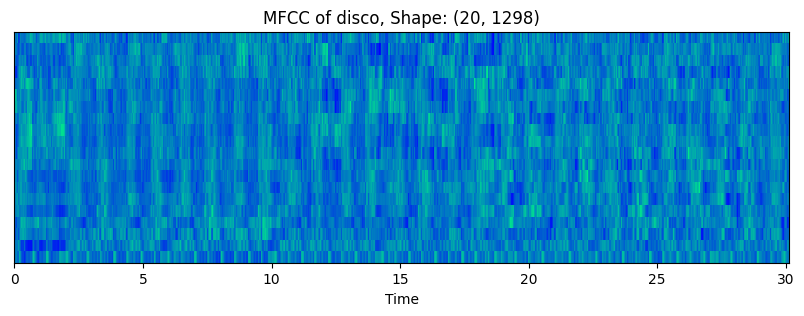

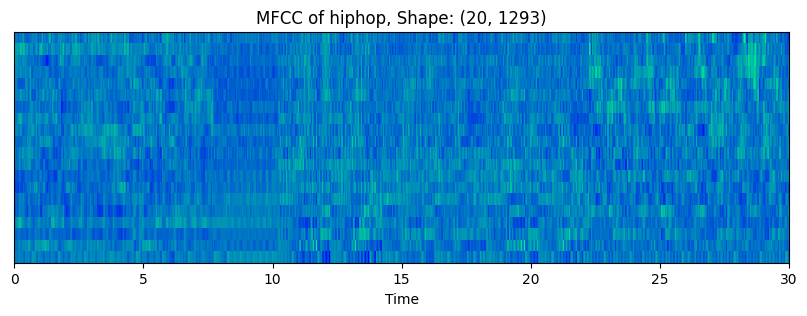

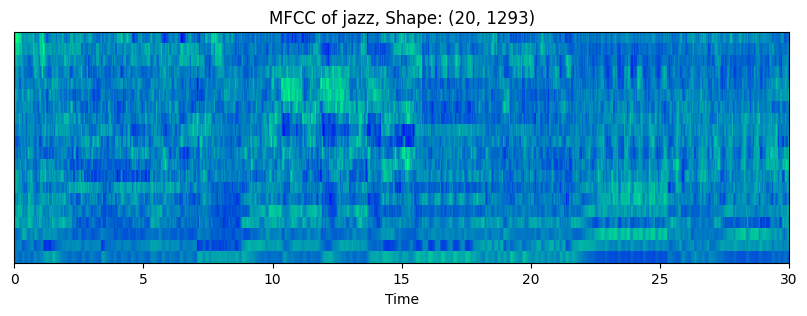

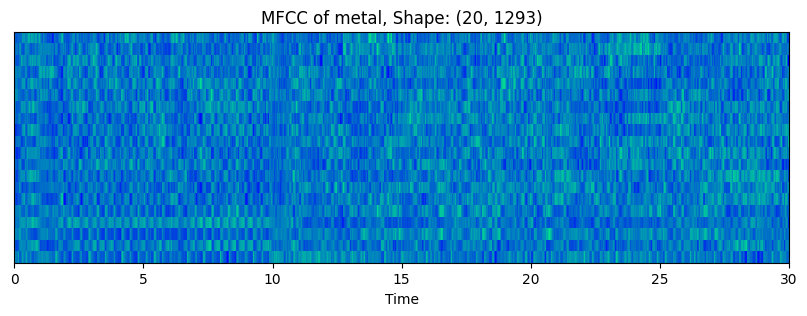

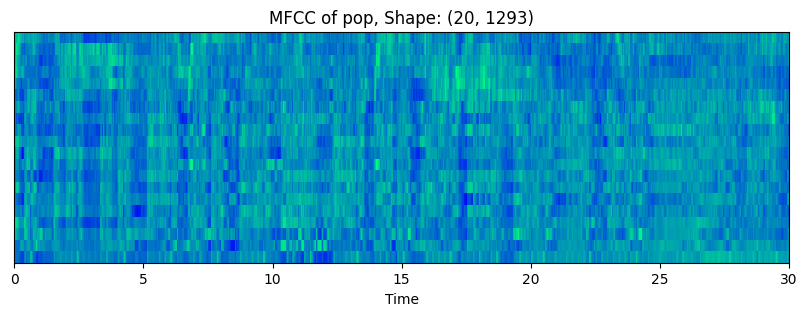

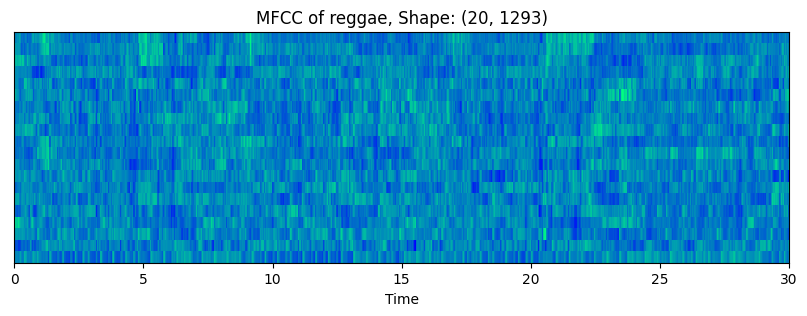

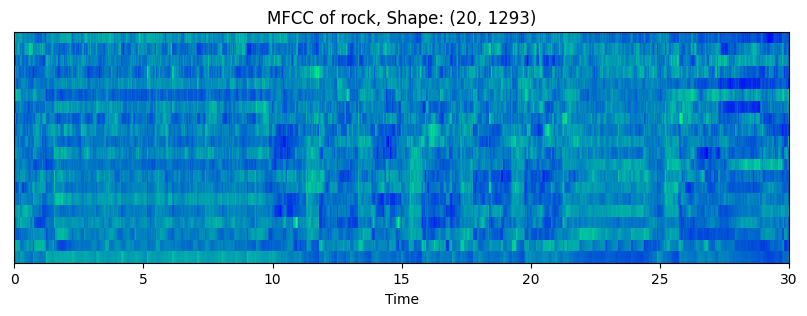

In [23]:
# Extracting MFCC from the audio
for g, a in zip(genres, audios):
    mfcc = librosa.feature.mfcc(y=a[0], sr=a[1])
    mfcc = scale(mfcc, axis=1, ) # Need to scale up to to display properly
    plt.figure(figsize=(10, 3))
    librosa.display.specshow(data=mfcc, sr=a[1], x_axis='time', cmap='winter')
    plt.title('MFCC of {}, Shape: {}'.format(g, mfcc.shape))

### Chroma Frequencies<sup>[3]</sup>
Chroma features in audio processing represent the distribution of musical pitch classes, typically represented as the 12 distinct pitch classes in Western music (C, C#, D, D#, E, F, F#, G, G#, A, A#, B). Chroma features capture the harmonic content of audio signals by disregarding the exact frequency of each note and focusing solely on the presence or absence of each pitch class. <br><br>

Different music genres often exhibit distinct harmonic characteristics, and chroma features provide a compact representation of these characteristics that can be effectively used for genre classification.<br>

Overall, chroma features provide a compact and informative representation of the harmonic content of audio signals, making them valuable for a wide range of audio processing and music analysis tasks, including key detection, chord recognition, genre classification, melody extraction, and content-based music retrieval.

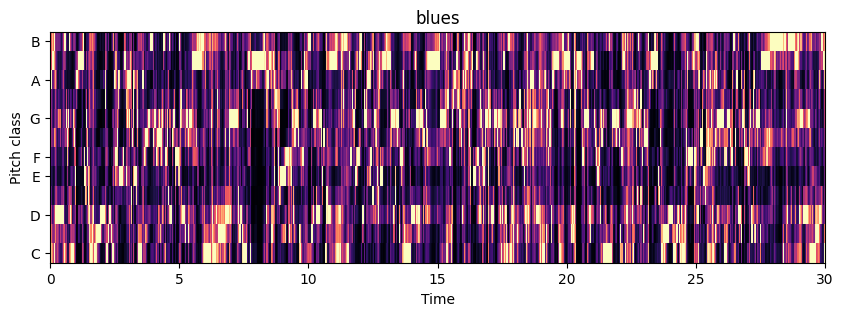

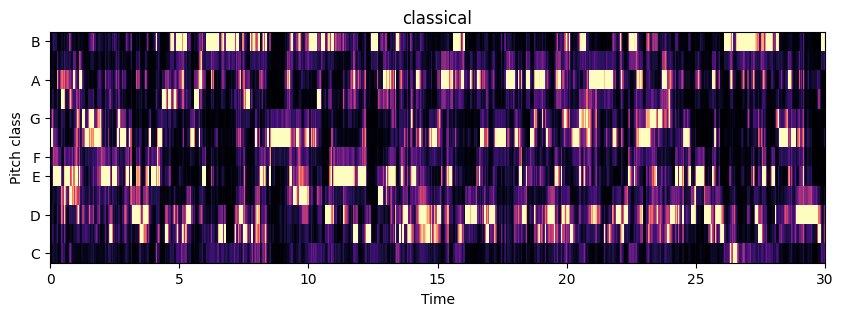

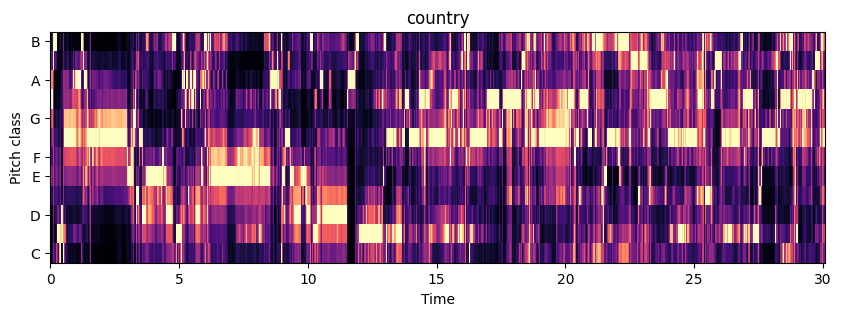

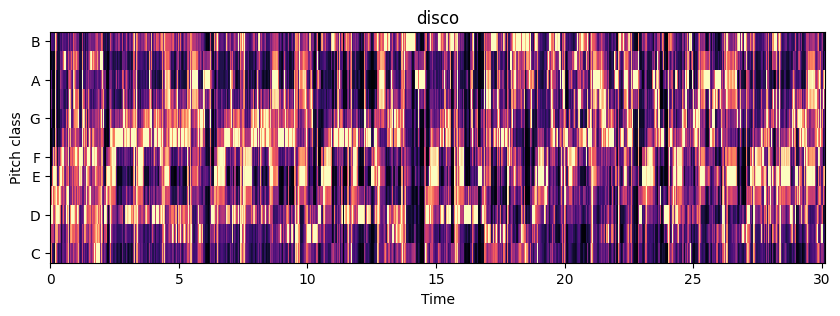

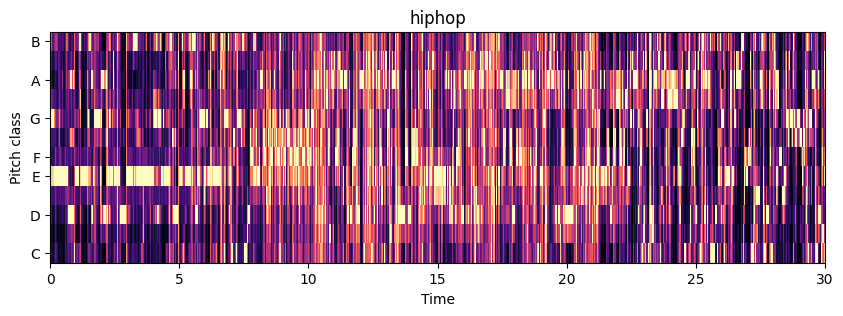

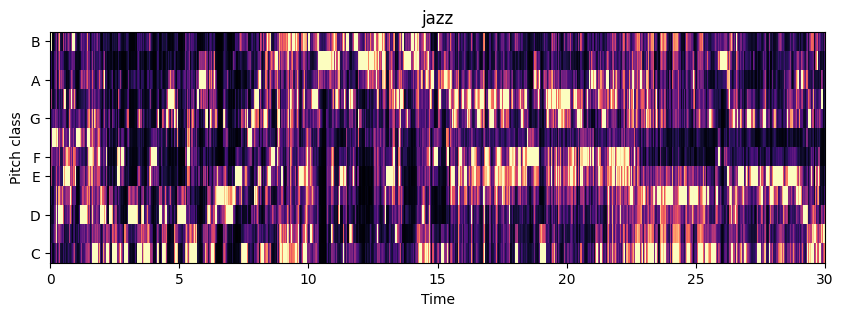

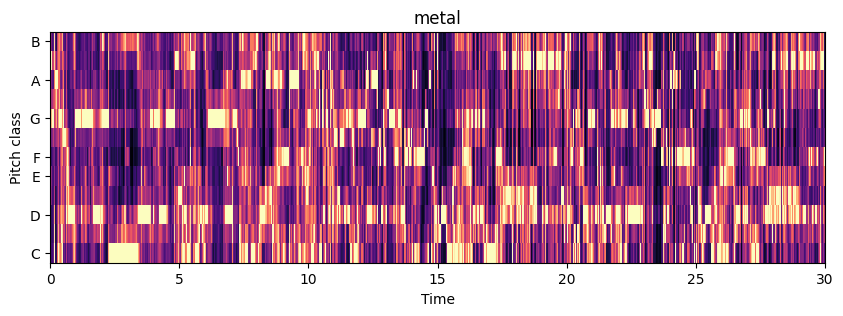

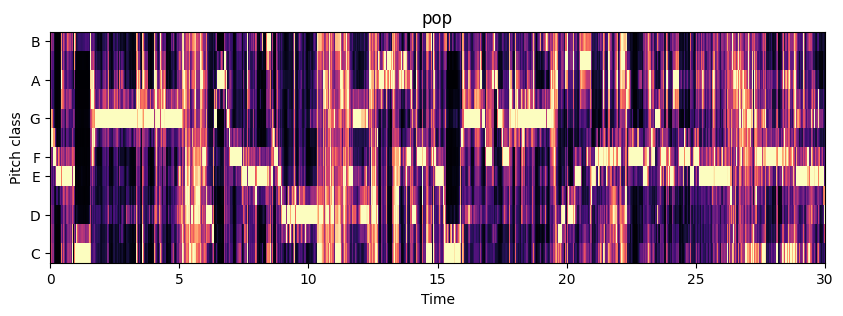

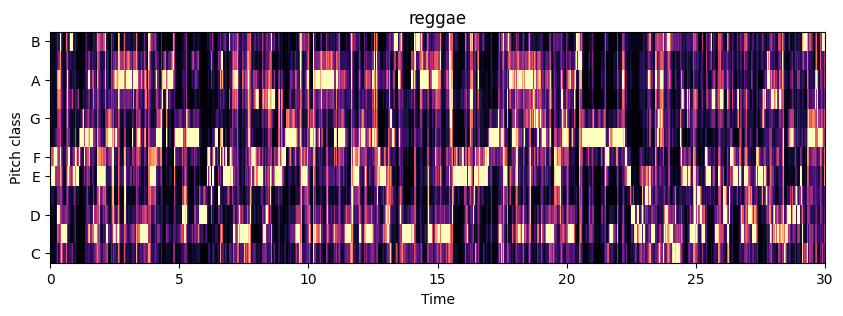

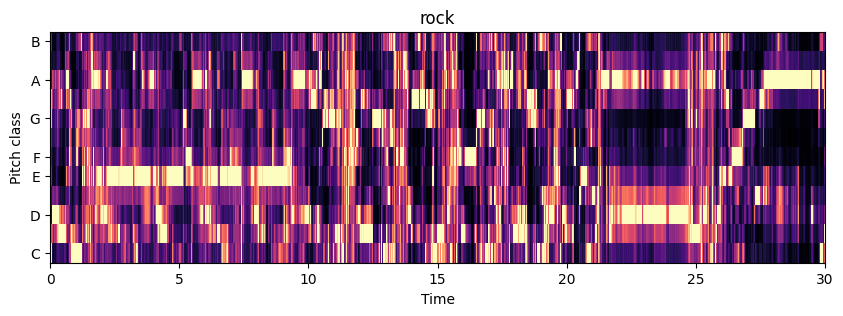

In [24]:
# Extracting Chroma Features
for g, a in zip(genres, audios):    
    chromagram = librosa.feature.chroma_stft(y=a[0], sr=a[1])
    plt.figure(figsize=(10, 3))
    librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma');
    plt.title('{}'.format(g))

## Exploring the Data

There's also a <code>feature_3_sec.csv</code> file which contains all the above features of audios from different genres.<br>
This data has mean and variance for each audio file of the features we analysed above.<br>

In [25]:
data3.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,1.080790e+06,0.081851,0.000558,-0.000078,0.008354,-0.000068,0.005535,129.199219,-118.627914,2440.286621,125.083626,260.956909,-23.443724,364.081726,41.321484,181.694855,-5.976108,152.963135,20.115141,75.652298,-16.045410,40.227104,17.855198,84.320282,-14.633434,83.437233,10.270527,97.001335,-9.708279,66.669891,10.183875,45.103611,-4.681614,34.169498,8.417439,48.269444,-7.233477,42.770947,-2.853603,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,6.722448e+05,0.087173,0.001030,-0.000099,0.004950,-0.000103,0.004854,123.046875,-125.590706,2038.344238,122.421227,216.774185,-20.718019,231.979767,50.128387,142.700409,-11.333302,139.243118,21.385401,77.817947,-15.960796,97.364029,19.454103,57.948093,-12.465918,68.271523,17.898169,56.222176,-11.732554,54.373909,8.145000,40.662876,-7.717751,30.808521,8.397150,48.784225,-8.300493,68.584824,4.074709,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,7.907127e+05,0.071383,0.000425,-0.000066,0.012476,0.000065,0.004357,123.046875,-132.441940,3798.532227,115.085175,257.321289,-14.811666,192.448074,50.189293,144.166031,-0.680819,128.376892,24.650375,66.371170,-13.506104,89.319336,15.643386,55.253967,-13.216637,120.308784,10.406025,35.757862,-7.991465,47.911613,11.853963,36.569931,-4.677677,40.725075,6.571110,30.686846,-2.424750,50.313499,4.806280,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,9.216524e+05,0.069426,0.000304,-0.000014,0.008318,0.000018,0.005927,123.046875,-118.231087,2508.781006,132.116501,332.650574,-18.758335,109.357529,39.769306,184.693344,-13.260426,144.398224,20.468134,122.516464,-14.563448,68.937332,18.745104,74.748886,-13.755463,73.868576,12.993759,41.549564,-12.648887,58.540478,10.389314,39.102024,-4.362739,60.714748,9.156193,40.411537,-9.889441,44.666325,-1.359111,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,6.102111e+05,0.070095,0.000289,0.000041,0.009634,-0.000106,0.005833,123.046875,-105.968376,2118.919922,134.643646,219.562622,-19.961748,171.878754,40.171753,103.120712,-14.271939,102.651230,18.734617,79.070000,-15.619381,48.510284,19.207966,53.642956,-18.274683,95.300995,14.316693,58.821163,-5.792194,55.030254,17.045437,43.229939,-5.681399,46.515259,5.705521,24.956211,-7.986080,39.816933,2.092937,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [26]:
data3.describe()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
count,9990.0,9990.000000,9990.000000,9990.000000,9.990000e+03,9990.000000,9.990000e+03,9990.000000,9.990000e+03,9990.000000,9.990000e+03,9990.000000,9990.000000,9990.000000,9.990000e+03,9990.000000,9.990000e+03,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000
mean,66149.0,0.379534,0.084876,0.130859,2.676388e-03,2199.219431,4.166727e+05,2241.385959,1.182711e+05,4566.076592,1.628790e+06,0.102578,0.002620,-0.000365,1.259757e-02,-0.000396,5.601553e-03,124.887709,-145.424643,2808.904199,100.988234,588.795354,-9.995014,374.137619,37.243725,183.911272,-2.009099,143.817714,15.395436,107.784375,-5.823034,98.505164,10.766659,74.795022,-7.569825,74.309310,8.283669,68.803998,-6.504168,63.812684,4.936315,57.790413,-5.186272,57.130389,2.164629,54.069345,-4.175271,52.678281,1.448240,49.988755,-4.198706,51.962753,0.739943,52.488851,-2.497306,54.973829,-0.917584,57.322614
std,0.0,0.090466,0.009637,0.068545,3.585628e-03,751.860611,4.349644e+05,543.854449,1.013505e+05,1642.065335,1.489398e+06,0.045651,0.003614,0.001699,1.263324e-02,0.001108,6.653225e-03,32.911676,106.456350,2596.256821,34.673178,459.705227,23.972522,294.470578,17.804460,133.164251,13.568717,109.272584,12.652512,75.900398,11.088698,65.536682,11.123007,45.881275,9.368422,44.733012,8.841558,41.864203,7.821168,40.218357,7.563187,37.481013,7.132049,35.746539,6.084283,37.715592,5.929457,37.251966,5.735149,34.442816,5.677379,36.400669,5.181313,38.177120,5.111799,41.585677,5.253243,46.444212
min,66149.0,0.107108,0.015345,0.000953,4.379535e-08,472.741636,8.118813e+02,499.162910,1.183520e+03,658.336276,1.145102e+03,0.013525,0.000005,-0.026672,9.312309e-23,-0.008794,4.672045e-08,24.377211,-662.171631,25.190538,-12.053392,9.665931,-104.249832,2.055229,-35.138493,3.540373,-47.886780,9.754141,-34.889263,5.267811,-45.187019,7.561506,-40.323467,6.899100,-39.451752,8.252314,-32.833546,7.584913,-40.008194,4.998892,-23.759195,2.345633,-29.350500,7.806118,-23.390091,3.230073,-30.467087,1.481917,-26.850016,1.325786,-27.809795,1.624544,-20.733809,3.437439,-27.448456,3.065302,-35.640659,0.282131
25%,66149.0,0.315698,0.079833,0.083782,6.145900e-04,1630.680158,1.231961e+05,1887.455790,4.876553e+04,3378.311110,5.595514e+05,0.067290,0.000628,-0.000127,4.086402e-03,-0.000579,1.106077e-03,103.359375,-201.474651,1143.226685,76.043871,270.420326,-26.884581,174.570415,24.450934,88.392767,-11.881086,67.975819,5.759286,53.944843,-14.464527,51.585960,2.528776,42.255037,-14.569940,42.856218,1.734222,40.205816,-12.203228,37.617884,-0.433691,34.455327,-10.352716,34.844897,-1.860355,32.415298,-8.184258,31.237773,-2.227478,29.584894,-7.951722,29.863448,-2.516638,29.636197,-5.734123,30.496412,-4.004475,30.011365
50%,66149.0,0.384741,0.085108,0.121253,1.491318e-03,2208.628236,2.650692e+05,2230.575595,8.996072e+04,4631.377892,1.160080e+06,0.097868,0.001390,-0.000013,8.429785e-03

In [27]:
data3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9990 entries, 0 to 9989
Data columns (total 60 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   filename                 9990 non-null   object 
 1   length                   9990 non-null   int64  
 2   chroma_stft_mean         9990 non-null   float64
 3   chroma_stft_var          9990 non-null   float64
 4   rms_mean                 9990 non-null   float64
 5   rms_var                  9990 non-null   float64
 6   spectral_centroid_mean   9990 non-null   float64
 7   spectral_centroid_var    9990 non-null   float64
 8   spectral_bandwidth_mean  9990 non-null   float64
 9   spectral_bandwidth_var   9990 non-null   float64
 10  rolloff_mean             9990 non-null   float64
 11  rolloff_var              9990 non-null   float64
 12  zero_crossing_rate_mean  9990 non-null   float64
 13  zero_crossing_rate_var   9990 non-null   float64
 14  harmony_mean            

### Null Values

In [28]:
data3.isnull().sum()

filename                   0
length                     0
chroma_stft_mean           0
chroma_stft_var            0
rms_mean                   0
rms_var                    0
spectral_centroid_mean     0
spectral_centroid_var      0
spectral_bandwidth_mean    0
spectral_bandwidth_var     0
rolloff_mean               0
rolloff_var                0
zero_crossing_rate_mean    0
zero_crossing_rate_var     0
harmony_mean               0
harmony_var                0
perceptr_mean              0
perceptr_var               0
tempo                      0
mfcc1_mean                 0
mfcc1_var                  0
mfcc2_mean                 0
mfcc2_var                  0
mfcc3_mean                 0
mfcc3_var                  0
mfcc4_mean                 0
mfcc4_var                  0
mfcc5_mean                 0
mfcc5_var                  0
mfcc6_mean                 0
mfcc6_var                  0
mfcc7_mean                 0
mfcc7_var                  0
mfcc8_mean                 0
mfcc8_var     

There are no null values so, there will be not much preprocessing.

### Box Plot for different genres
Plotting the box plot of tempo of all the genres

<Axes: xlabel='label', ylabel='tempo'>

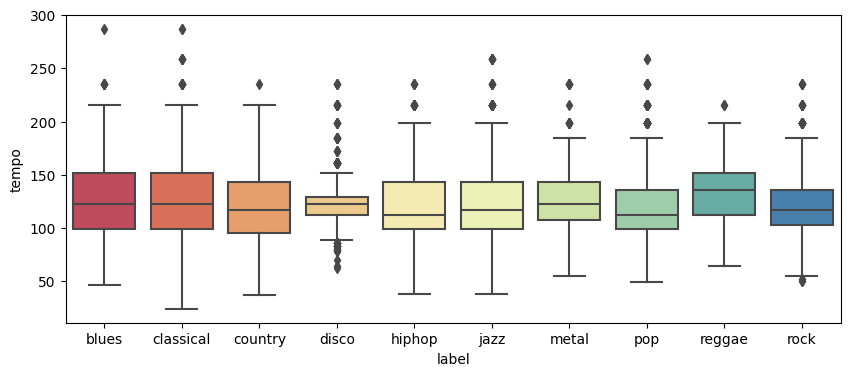

In [29]:
plt.figure(figsize=(10, 4))
sns.boxplot(data=data3, x='label', y='tempo', palette="Spectral")

### Coorelation Heatmap

In [30]:
# Differentiating the mean and variance features
mean_features = [s for s in data.columns if 'mean' in s]
mean_features.insert(0, 'tempo') # Displaying temp as well in the correlation

var_features = [s for s in data.columns if 'var' in s]

Text(0.5, 1.0, 'Correlation of Mean Variables')

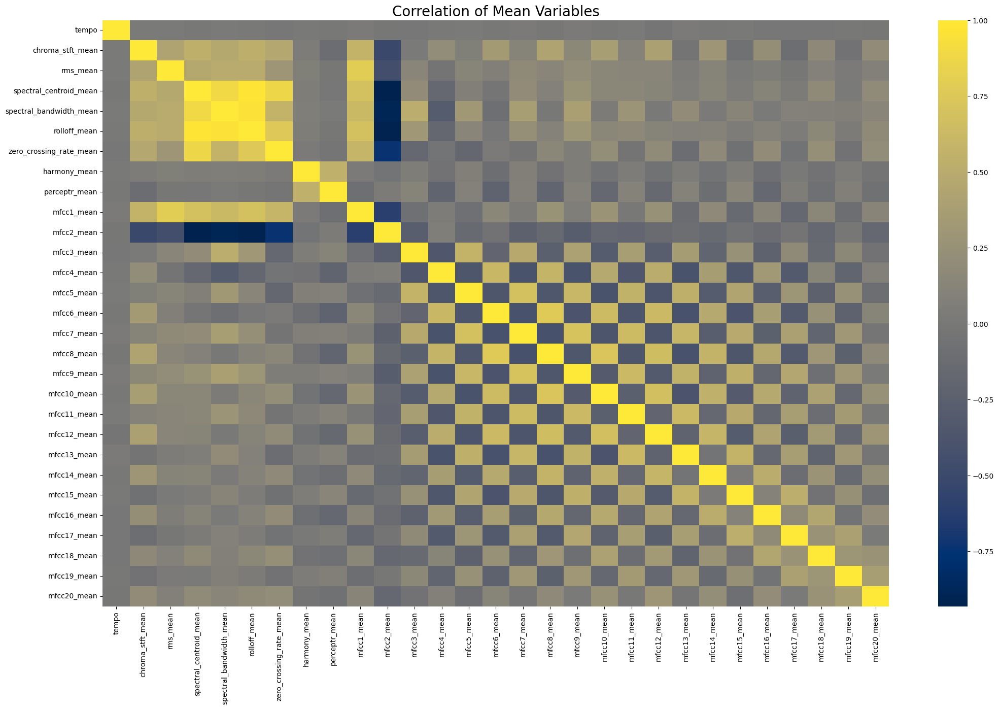

In [31]:
# Correlation heatmap of 'mean' variables
plt.figure(figsize=(25, 15))
sns.heatmap(data3[mean_features].corr(), cmap='cividis')
plt.title('Correlation of Mean Variables', fontsize=20)

Text(0.5, 1.0, 'Correlation of Variance Variables')

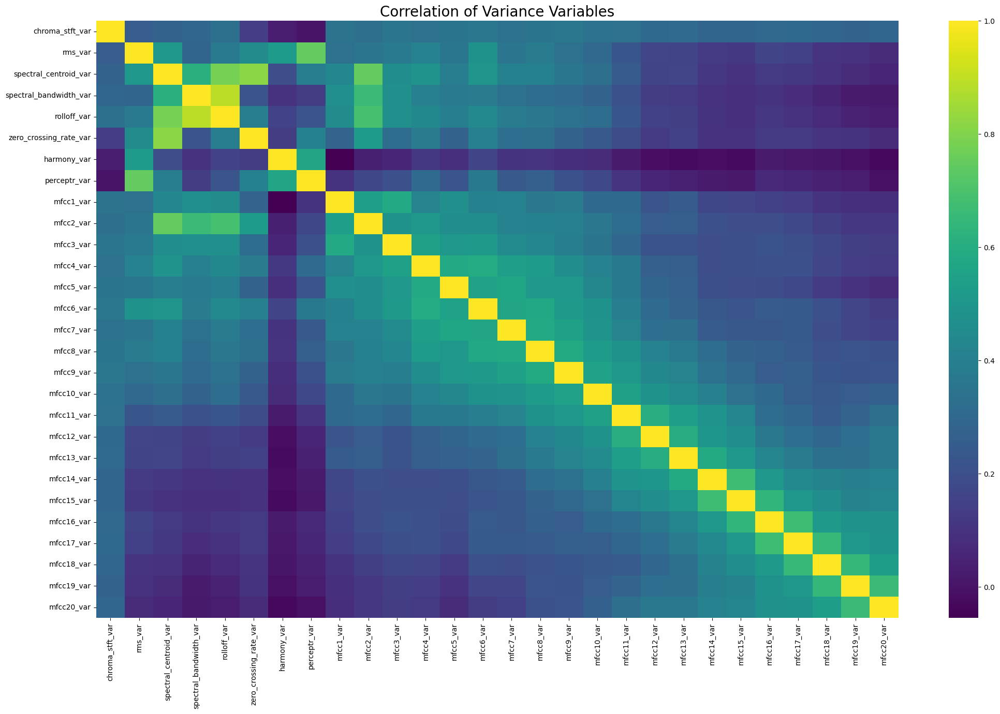

In [32]:
# Correlation heatmap of 'variance' variables
plt.figure(figsize=(25, 15))
sns.heatmap(data3[var_features].corr(), cmap='viridis')
plt.title('Correlation of Variance Variables', fontsize=20)

### Removing Unwanted columns
The <code>filename</code> and <code>length</code> features are not required for the analysis as filename contains the name of the file and every audio file is of same length i.e, 30 seconds.

In [33]:
# dropping filename and length columns
X = data3.drop(columns=['filename','length', 'label'])

# Encoding the genres to numbers
y = LabelEncoder().fit_transform(data3['label'])

<br><br>

## Classification Model Training

In [34]:
# Normalizing all the features
cols = X.columns
min_max_scaler = MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns=cols)

In [35]:
# Splitting the training and testing data, 70% - 30%
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [36]:
def print_accuracy(model):
    print("Training Accuracy: {:.2f}%".format(model.score(X_train, y_train) * 100))
    print("Testing Accuracy: {:.2f}%".format(model.score(X_test, y_test) * 100))

### Logistic Regression

In [37]:
lr = LogisticRegression(multi_class='multinomial', penalty='l2', solver='lbfgs')
lr.fit(X_train, y_train)
print_accuracy(lr)

Training Accuracy: 70.57%
Testing Accuracy: 67.73%


### K Nearest Neighbor

In [38]:
# Default Decision Tree
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train, y_train)
print("Training Accracy: {:.2f}%".format(knn.score(X_train.values, y_train) * 100))
print("Testing Accracy: {:.2f}%".format(knn.score(X_test.values, y_test) * 100))
# accuracy_score(y_test, knn.predict(X_test.values))

Training Accracy: 89.79%
Testing Accracy: 85.89%


In [39]:
parameters = {
    'n_neighbors': list(range(1, 21)),
    'weights': ['uniform', 'distance'],
    'algorithm': ['ball_tree', 'kd_tree', 'brute']
}
grid_search_knn = GridSearchCV(KNeighborsClassifier(), param_grid=parameters, n_jobs=-1, verbose=True)
grid_search_knn.fit(X_train, y_train)
print(f"Best Parameters for KNN: {grid_search_knn.best_params_}")

Fitting 5 folds for each of 120 candidates, totalling 600 fits
Best Parameters for KNN: {'algorithm': 'ball_tree', 'n_neighbors': 1, 'weights': 'uniform'}


In [40]:
# Training KNN with best parameters
print_accuracy(grid_search_knn.best_estimator_)

Training Accuracy: 99.91%
Testing Accuracy: 92.19%


### Decision Tree

In [41]:
# Default Decision Tree
dtree = DecisionTreeClassifier(criterion='gini', max_depth=None, max_features=None)
dtree.fit(X_train, y_train)
print_accuracy(dtree)

Training Accuracy: 99.91%
Testing Accuracy: 61.90%


In [42]:
# Decision Tree Pruning -> This will take too long to train on different parameters, hence commented.
# To run this code use google colab with GPU runtime
# parameters = {
#     'max_depth': list(range(5, 10)),
#     'max_features': range(4, 58),
#     'criterion':['entropy', 'gini']
# }
# grid_search = GridSearchCV(DecisionTreeClassifier(), param_grid=parameters, n_jobs=-1, verbose=True)
# grid_search.fit(X_train, y_train)
# print(f"Best Parameters for DecisionTree: {grid_search.best_params_}")

In [43]:
# Best Parameters Decision tree accuracy
# print_accuracy(grid_search.best_estimator_)

### Random Forest

In [44]:
random_forest = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=0)
random_forest.fit(X_train, y_train)
print_accuracy(random_forest)

Training Accuracy: 97.07%
Testing Accuracy: 80.15%


### CatBoost

In [45]:
cb = CatBoostClassifier(verbose=0, eval_metric='Accuracy', loss_function='MultiClass', )
cb.fit(X_train, y_train)
print_accuracy(cb)

Training Accuracy: 99.90%
Testing Accuracy: 90.22%


### XGBoost

In [46]:
xgboost_model = xgb.XGBClassifier(n_estimators=1000, learning_rate=0.05)
xgboost_model.fit(X_train, LabelEncoder().fit_transform(y_train))
print_accuracy(xgboost_model)

Training Accuracy: 99.91%
Testing Accuracy: 90.19%


#### XGBoost and CastBoost are the best models of all the models with ~90 % accuracy

Text(0.5, 1.0, 'XGBOOST Confusion Matrix')

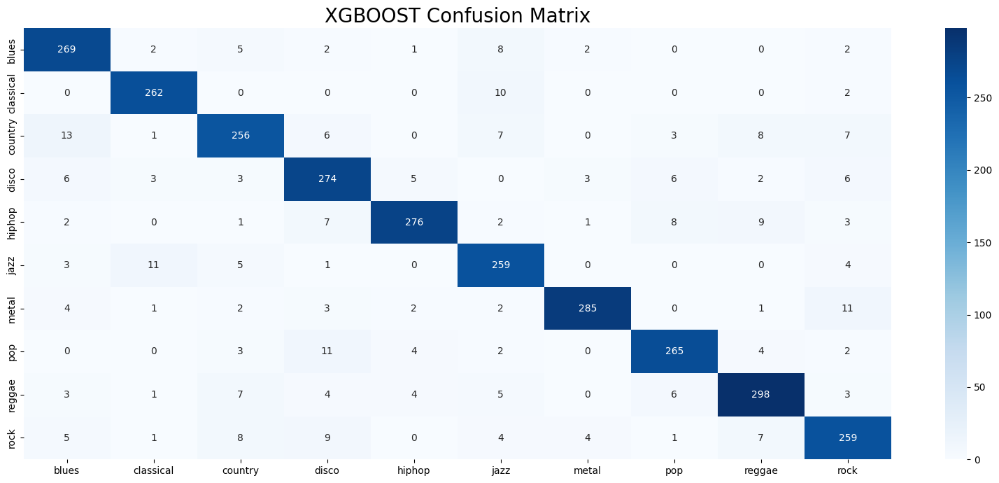

In [47]:
# Confusion Matrix of XGBoost
plt.figure(figsize=(20, 8))
xgb_conf_mat = confusion_matrix(y_test, xgboost_model.predict(X_test))
sns.heatmap(xgb_conf_mat, annot=True, xticklabels=genres, yticklabels=genres, fmt="d", cmap='Blues')
plt.title('XGBOOST Confusion Matrix', fontsize=20)

Text(0.5, 1.0, 'XGBOOST Feature Importance')

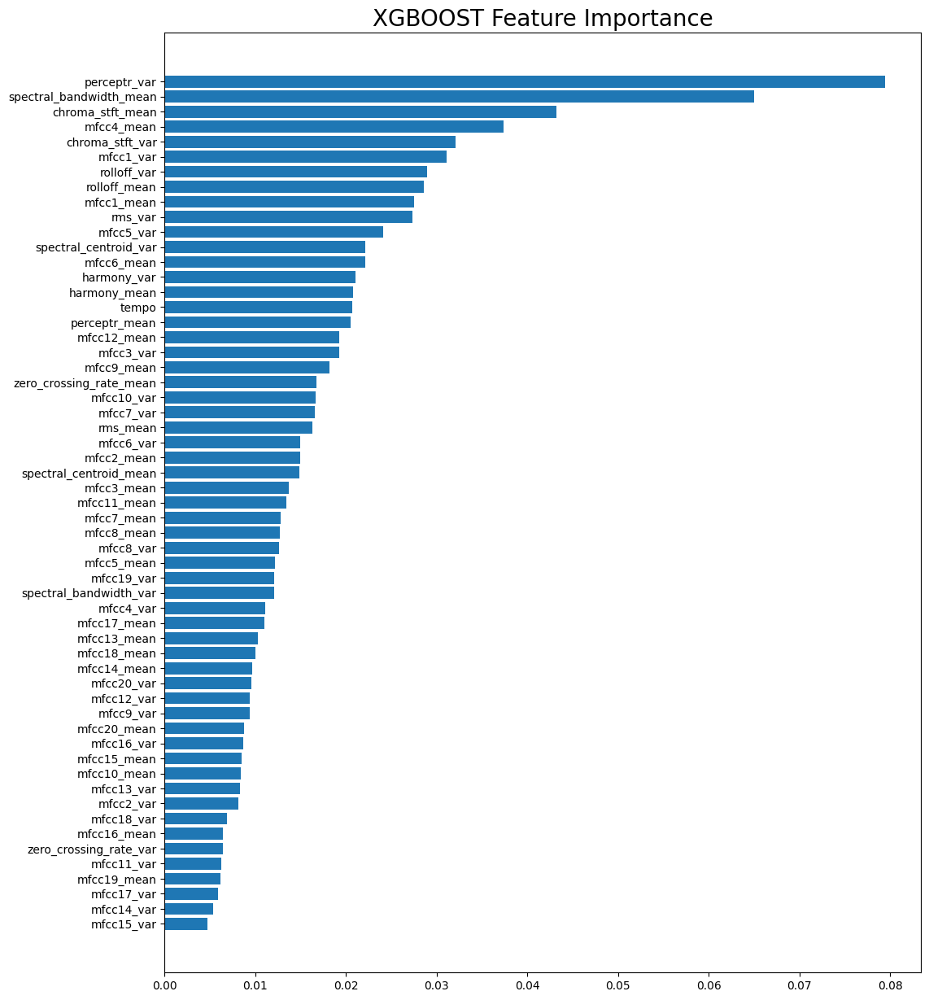

In [48]:
feature_importance = xgboost_model.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 15))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('XGBOOST Feature Importance', fontsize=20)

Text(0.5, 1.0, 'CATBoost Confusion Matrix')

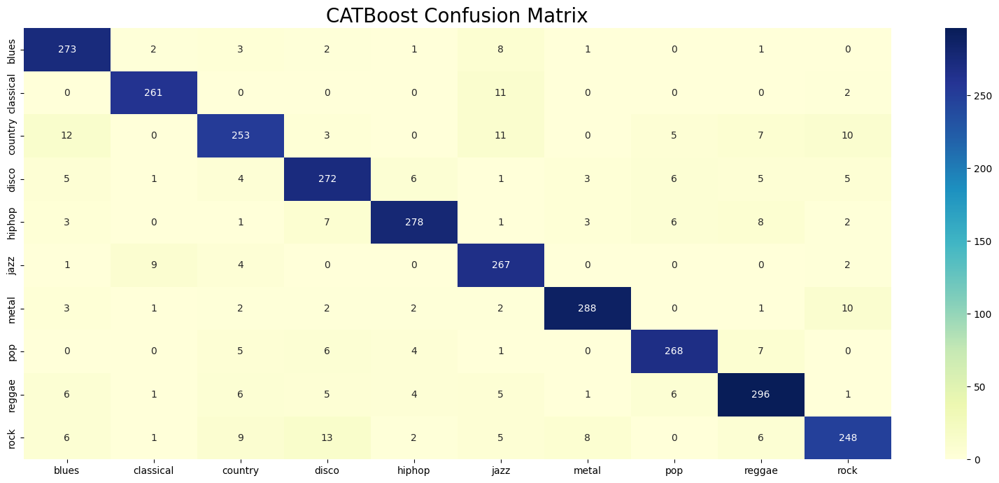

In [49]:
# Confusion Matrix of CatBoost
plt.figure(figsize=(20, 8))
cb_conf_mat = confusion_matrix(y_test, cb.predict(X_test))
sns.heatmap(cb_conf_mat, annot=True, xticklabels=genres, yticklabels=genres, fmt='d', cmap='YlGnBu')
plt.title('CATBoost Confusion Matrix', fontsize=20)

Text(0.5, 1.0, 'CAT Boost Feature Importance')

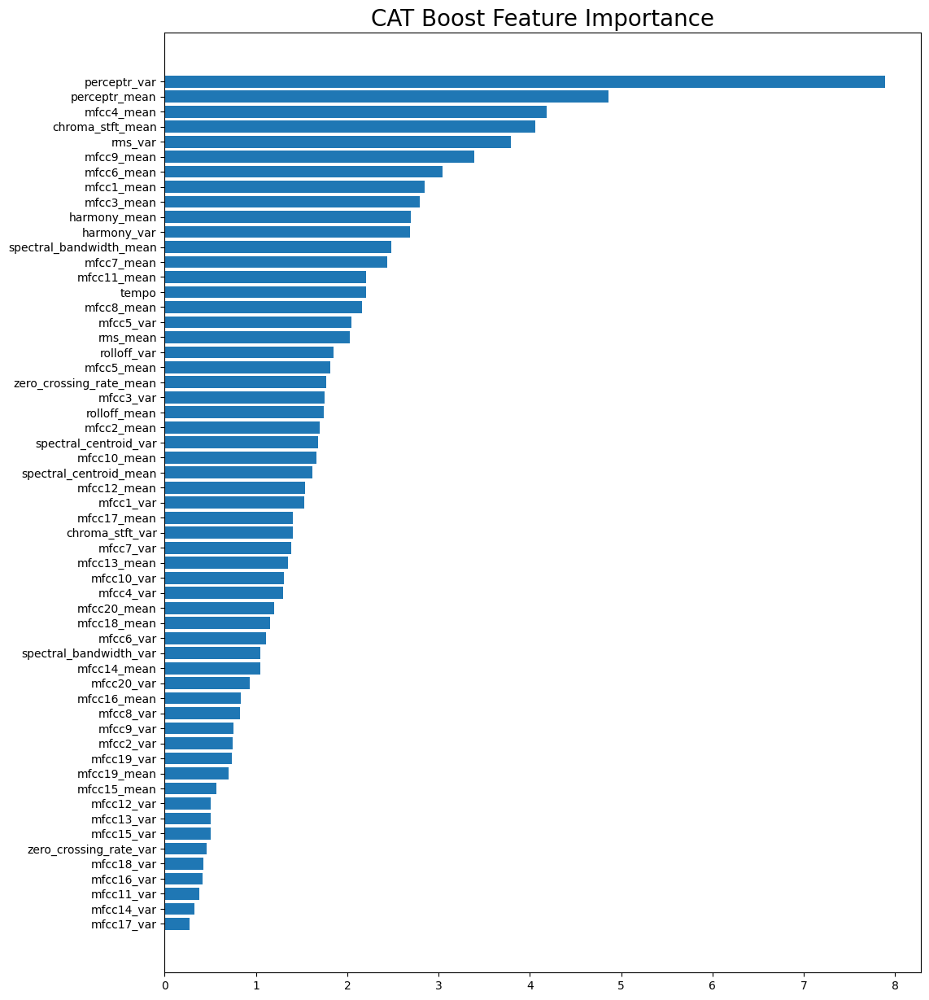

In [50]:
feature_importance = cb.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 15))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('CAT Boost Feature Importance', fontsize=20)

## Saving Model

In [51]:
# Save Logistic Regression model
joblib.dump(lr, 'models/logistic_regression_model.pkl')

# Save K Nearest Neighbor model
joblib.dump(knn, 'models/knn_model.pkl')

# Save Decision Tree model
joblib.dump(dtree, 'models/decision_tree_model.pkl')

# Save Random Forest model
joblib.dump(random_forest, 'models/random_forest_model.pkl')

# Save CatBoost model
cb.save_model('models/catboost_model.cbm')

# Save XGBoost model
xgboost_model.save_model('models/xgboost_model.xgb')

### References

1. [What does librosa.load return? - Stackoverflow](https://stackoverflow.com/a/61986685)
2. [Fourier Transform - Byjus](https://byjus.com/maths/fourier-transform/)
3. [ChatGPT](https://chat.openai.com)
4. [Spectrogram - Wikipedia](https://en.wikipedia.org/wiki/Spectrogram)
5. [Mel Scale - Analytics Vidhya](https://medium.com/analytics-vidhya/understanding-the-mel-spectrogram-fca2afa2ce53)
6. [Zero-Crossing Rate - Wikipedia](https://en.wikipedia.org/wiki/Zero-crossing_rate)
7. [Harmonic and Percussive Sounds - Audiolabs](https://www.audiolabs-erlangen.de/resources/MIR/FMP/C8/C8S1_HPS.html)
8. [Mel-frequency cepstral coefficients(MFCC) - Analytics Vidhya](https://www.analyticsvidhya.com/blog/2021/06/mfcc-technique-for-speech-recognition/)